# **Одномерный анализ данных для улучшения качества данных**

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import scipy
import seaborn as sns
import numpy as np
from scipy.stats import zscore
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, root_mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, QuantileTransformer, StandardScaler
from scipy.stats import boxcox, yeojohnson
import warnings
warnings.filterwarnings("ignore")

In [2]:
SEED = 42

file_id = '1lbOez3uheggR4F7jqCHgVNfVtvucCSp4'
URL = f"https://drive.google.com/uc?id={file_id}"

df = pd.read_csv(URL)
df.head()

,mol,CID,Class,Model,pIC50,MW,AlogP,HBA,HBD,RB,...,PEOE6 (PEOE6),PEOE7 (PEOE7),PEOE8 (PEOE8),PEOE9 (PEOE9),PEOE10 (PEOE10),PEOE11 (PEOE11),PEOE12 (PEOE12),PEOE13 (PEOE13),PEOE14 (PEOE14),idx
0,S(=O)(=O)(N(C)c1cc(C(=O)NC(C(O)CC(OC)C(=O)NC(C...,BACE_275,1,Train,9.494850,851.95490,3.9826,8,5,20,...,106.411420,39.931225,290.24533,304.418120,52.429832,0.000000,39.531593,0.0,0.000000,1
1,O=C(NCCC(C)(C)C)C(Cc1c(N)nc2c(c1)cc(-c1c(C)ccc...,BACE_276,1,Train,9.187087,403.55969,5.7644,2,2,7,...,84.122887,46.316166,247.78938,90.395477,37.133846,0.000000,7.980170,0.0,0.000000,2
2,O=C(N[C@H]1CC(C)(C)OCC1)[C@@H](Cc1c(N)nc2c(c1)...,BACE_1,1,Train,9.154901,431.56979,4.4014,3,2,5,...,53.205711,78.640335,226.85541,107.434910,37.133846,0.000000,7.980170,0.0,0.000000,3
3,Fc1cc(F)cc(CC(NC(=O)C(CCc2ccccc2)N2C(=O)C(NC(=...,BACE_277,1,Train,9.050610,615.73102,1.4277,5,5,13,...,67.960800,38.272877,304.05246,152.161880,34.923889,7.980170,32.336994,0.0,24.663788,4
4,Fc1cc(CC(NC(=O)C)C(O)C[N+]C2c3c(OC4(C2)CCC4)nc...,BACE_279,1,Train,9.000000,484.62601,2.9008,4,3,9,...,48.077168,45.445873,299.93298,95.216072,34.435734,15.387257,8.188327,0.0,24.663788,5


Создаём функцию для обучения модели

In [3]:
def model_testing(model, preprocessor, X, y):
    # for col in discrete_features:
    #     print(f"{col} unique:", X[col].unique())
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    print(f'r2_score: {r2:.4f}')
    print(f'RMSE: {rmse:.4f}')

    return r2, rmse

Инициализируем словарь с результатами и препроцессор

In [4]:
results = {}

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), make_column_selector(dtype_include="number")),
    ("cat", OneHotEncoder(), make_column_selector(dtype_include="category"))
])

model = LinearRegression(n_jobs=-1)

Обучаем модель на сырых данных

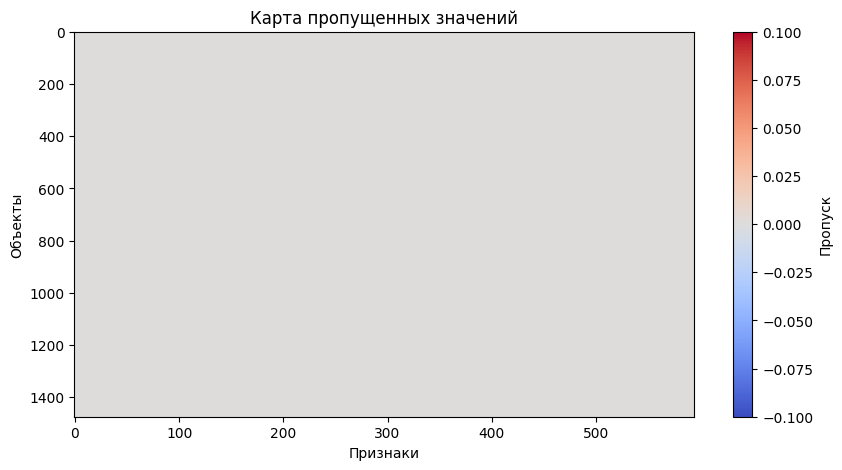

In [5]:
plt.figure(figsize=(10,5))
plt.imshow(df.isnull(), aspect='auto', cmap='coolwarm')
plt.title("Карта пропущенных значений")
plt.xlabel("Признаки")
plt.ylabel("Объекты")
plt.colorbar(label="Пропуск")
plt.show()


In [6]:
df.isnull().sum().sum()

np.int64(0)

Пропусков нет, NaN нет. Можно запускать обучение

In [7]:
X = df.drop(['pIC50', 'Model', 'mol', 'CID'], axis=1)
y = df['pIC50']

results['Без предобработки'] = model_testing(model, preprocessor, X, y)

r2_score: -9544814.7457
RMSE: 4124.6234


In [8]:
# Список физико-химических дескрипторов
physchem_cols = [
    'pIC50', 'MW', 'AlogP', 'HBA', 'HBD', 'RB',
    'ChiralCenterCount', 'ChiralCenterCountAllPossible',
    'RingCount', 'PSA', 'Estate', 'MR', 'Polar'
]

# Выбираем только эти колонки
df_raw = df[physchem_cols]
df_raw.head()

,pIC50,MW,AlogP,HBA,HBD,RB,ChiralCenterCount,ChiralCenterCountAllPossible,RingCount,PSA,Estate,MR,Polar
0,9.494850,851.95490,3.9826,8,5,20,0,6,4,200.850010,160.419010,219.97549,100.001000
1,9.187087,403.55969,5.7644,2,2,7,0,1,3,68.010002,62.918999,125.26950,56.700001
2,9.154901,431.56979,4.4014,3,2,5,2,2,4,77.239998,67.251999,129.90390,58.397999
3,9.050610,615.73102,1.4277,5,5,13,0,7,4,135.580000,112.917000,159.51740,70.750000
4,9.000000,484.62601,2.9008,4,3,9,0,3,4,88.059998,79.000999,132.37019,59.374001


## EDA

Для большего понимания:  

**pIC50** — отрицательный логарифм концентрации ингибитора, характеризует активность соединения.

**MW** — молекулярная масса, отражает размер молекулы.

**AlogP** — расчетный коэффициент распределения октанол/вода, показатель липофильности.

**HBA** — количество акцепторов водородных связей (Hydrogen Bond Acceptors).

**HBD** — количество доноров водородных связей (Hydrogen Bond Donors).

**RB** — число вращающихся связей (Rotatable Bonds).

**ChiralCenterCount** и **ChiralCenterCountAllPossible** — количество хиральных центров, реально существующих и возможных.

**RingCount** — количество колец в молекуле.

**PSA** — полярная поверхность (Polar Surface Area).

**Estate** — электронные состояния атомов (electrotopological state).

**MR** — молекулярный рефрактивность, отражает поляризуемость.

**Polar** — общее количество полярных атомов.

In [9]:
df_raw.describe()

,pIC50,MW,AlogP,HBA,HBD,RB,ChiralCenterCount,ChiralCenterCountAllPossible,RingCount,PSA,Estate,MR,Polar
count,1475.000000,1475.000000,1475.000000,1475.000000,1475.00000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000
mean,6.510915,479.566368,3.204501,3.727458,1.99322,8.030508,0.538983,2.322712,3.780339,98.999648,82.704351,127.692463,58.485392
std,1.315995,117.197364,1.362102,1.401307,1.57489,4.572915,1.177730,1.573265,0.857100,31.013558,23.379359,30.459443,13.570310
min,2.544546,144.173200,-3.600000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,16.610001,24.000999,44.173500,18.617001
25%,5.606447,389.844360,2.355900,3.000000,0.00000,4.000000,0.000000,1.000000,3.000000,77.100003,65.057499,103.522700,47.848999
50%,6.744728,464.573300,3.186700,4.000000,2.00000,7.000000,0.000000,2.000000,4.000000,95.040001,81.084999,124.254000,56.851002
75%,7.522879,564.206665,4.030500,4.000000,3.00000,11.000000,1.000000,3.000000,4.000000,116.630000,97.126000,148.852895,68.625000
max,9.494850,1034.394900,7.617400,12.000000,7.00000,28.000000,10.000000,11.000000,7.000000,287.620000,186.754000,274.613490,121.917000


| Переменная                       | Основные наблюдения                                       | Интерпретация                                                                                                 |
| -------------------------------- | --------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------- |
| **pIC50**                        | Среднее 6.51, медиана 6.74, STD 1.32, мин=2.54, макс=9.49 | Лёгкая левосторонняя асимметрия; большинство соединений умеренно/высоко активны; есть низкоактивный хвост.    |
| **MW**                           | Среднее 479, медиана 465, STD 117, макс > 1000            | Широкое распределение; тяжелый «правый хвост»; присутствуют крупные молекулы-выбросы.                         |
| **AlogP**                        | Среднее 3.20, медиана 3.19, STD 1.36, диапазон -3.6 — 7.6 | Почти симметричное; очень широкий диапазон; отрицательные значения могут быть шумом или особенностью расчёта. |
| **HBA**                          | Среднее 3.73, медиана 4, максимум 12                      | Нормальное распределение; умеренный разброс; высокие значения характерны для больших молекул.                 |
| **HBD**                          | Среднее 1.99, медиана 2, максимум 7                       | Большинство соединений имеют 0–3 доноров; редкие высокие значения образуют правый хвост.                      |
| **RB**                           | Среднее 8.03, медиана 7, максимум 28                      | Сильная правосторонняя асимметрия; много гибких молекул; присутствуют выбросы.                                |
| **HeavyAtomCount**               | Среднее 34, медиана 33, максимум 73                       | Почти симметричное распределение; умеренный разброс; несколько тяжёлых структур.                              |
| **ChiralCenterCount**            | Среднее 0.54, медиана 0, макс=10                          | Более половины молекул ахиральные; большой разброс вплоть до сложных хиральных структур.                      |
| **ChiralCenterCountAllPossible** | Среднее 2.32, медиана 2, макс=11                          | У многих соединений потенциальных центров больше фактических; умеренный разброс.                              |
| **RingCount**                    | Среднее 3.78, медиана 4, макс=7                           | Большинство молекул циклические; распределение симметричное.                                                  |
| **PSA**                          | Среднее 99, медиана 95, STD 31, макс 287                  | Широкий диапазон; есть выбросы с очень высокой полярностью; умеренно симметрично.                             |
| **Estate**                       | Среднее 82.7, STD 23.4, макс 186                          | Очень широкое распределение; высокие значения отражают сложную электронную топологию; возможные выбросы.      |
| **MR**                           | Среднее 127.7, медиана 124, STD 30                        | Умеренно симметричное; значительный разброс вследствие разных размеров молекул.                               |
| **Polar**                        | Среднее 58.5, медиана 56.8, облачный диапазон             | Почти симметричное распределение; редкие высокополярные соединения формируют правый хвост.                    |


### Визуализация

In [10]:
def show_graphs(df, n_cols=4, boxes=False):
    n_rows = len(df.columns) // n_cols + 1
    # Гистограммы
    plt.figure(figsize=(n_cols * 4, n_rows * 3))
    for i, col in enumerate(df.columns, 1):
        plt.subplot(n_rows, n_cols, i)
        # Plot histogram as density to easily overlay PDF
        sns.histplot(df[col], kde=False, color='pink', stat='density')

        # Add normal distribution curve
        mu, std = df[col].mean(), df[col].std()
        xmin, xmax = plt.xlim()
        x = np.linspace(xmin, xmax, 100)
        p = scipy.stats.norm.pdf(x, mu, std)
        plt.plot(x, p, 'k', linewidth=2, label='Нормальное распределение')
        plt.title(f'{col} (Среднее: {mu:.2f}, СКО: {std:.2f})')
        plt.legend()


    plt.suptitle("Гистограммы распределений физических и химических дескрипторов с нормальным распределением", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Графики плотности
    plt.figure(figsize=(n_cols * 4, n_rows * 3))
    for i, col in enumerate(df.columns, 1):
        plt.subplot(n_rows, n_cols, i)
        # Plot KDE
        sns.kdeplot(df[col], shade=True, color='pink')

        # Add normal distribution curve
        mu, std = df[col].mean(), df[col].std()
        xmin, xmax = plt.xlim()
        x = np.linspace(xmin, xmax, 100)
        p = scipy.stats.norm.pdf(x, mu, std)
        plt.plot(x, p, 'k', linewidth=2, linestyle='--', label='Нормальное распределение')
        plt.title(f'{col} (Среднее: {mu:.2f}, СКО: {std:.2f})')
        plt.legend()

    plt.suptitle("Плотность распределений физических и химических дескрипторов с нормальным распределением", fontsize=16)
    plt.tight_layout()
    plt.show()

    if boxes:
        # Boxplot
        plt.figure(figsize=(n_cols * 3, n_rows * 2))
        for i, col in enumerate(df.columns, 1):
            plt.subplot(n_rows, n_cols, i)
            sns.boxplot(x=df[col], color='pink')

        plt.suptitle("Выбросы физических и химических дескрипторов", fontsize=14)
        plt.tight_layout()
        plt.show()

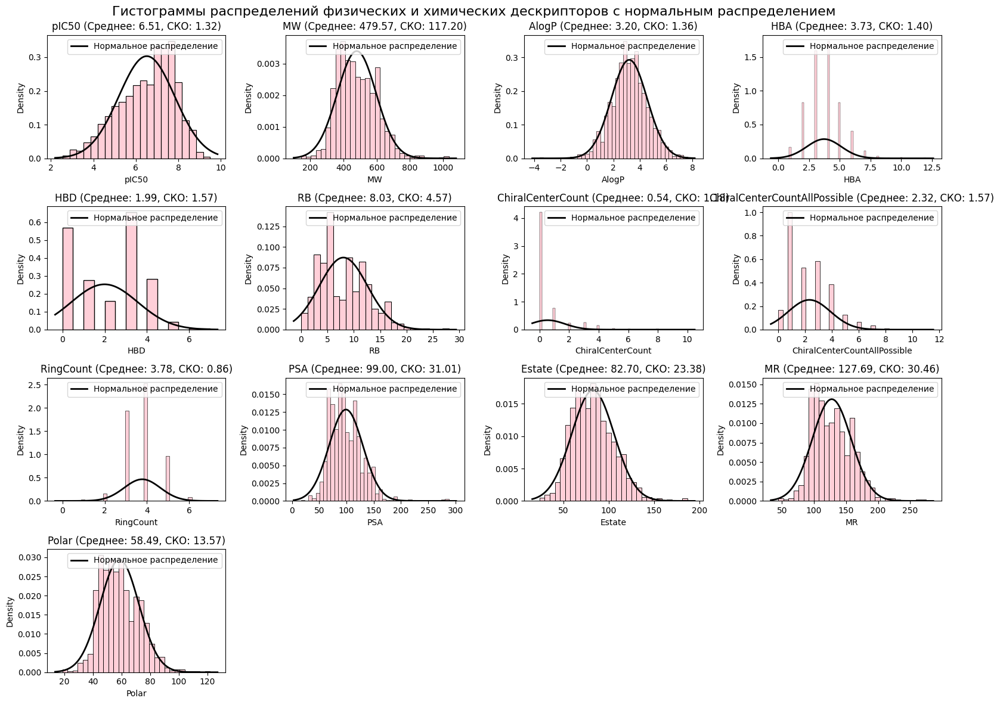

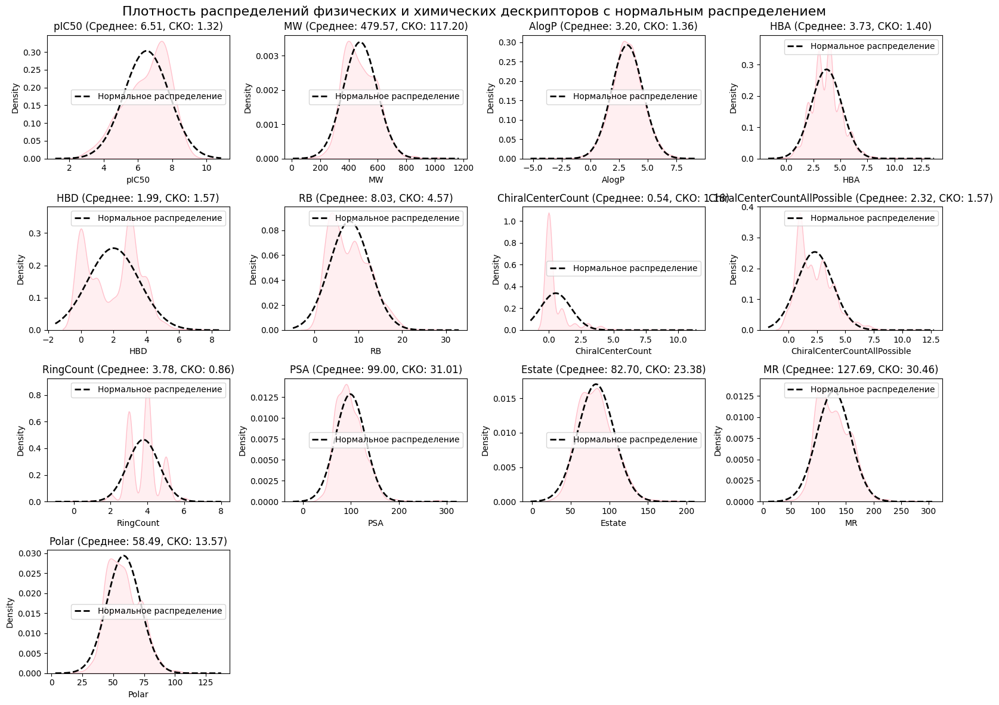

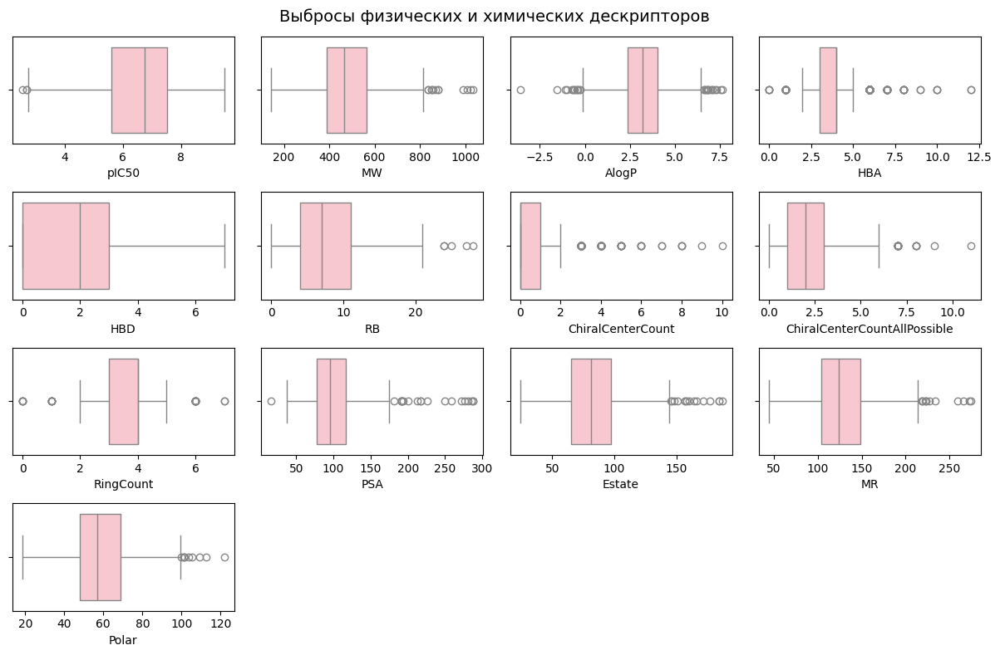

In [11]:
show_graphs(df_raw, boxes=True)

**Вывод по визуализации и анализу физико-химических дескрипторов:**

- Boxplot показывает редкие экстремальные значения для большинства признаков, кроме HBA и ChiralCenterCount, где выбросов больше 10%.

- Матрица корреляций и численные значения позволяют понять взаимосвязь между признаками и выявить сильные линейные зависимости, что важно для дальнейшего моделирования.

- Данные чистые, без пропусков, что упрощает подготовку к моделированию и визуальному анализу.

- Физико-химические дескрипторы хорошо подходят для интерпретации химической природы молекул, в то время как топологические и векторные дескрипторы больше полезны для алгоритмических методов и предсказаний.

Обучаем модель с минимальной предобработкой данных

In [12]:
# дискретные признаки (их не трогаем)
discrete_features = [
    "HBD", "HBA", "RB",
    "ChiralCenterCount",
    "ChiralCenterCountAllPossible",
    "RingCount"
]

# непрерывные
continuous_features = ['MW', 'AlogP', 'PSA', 'pIC50', 'Estate', 'MR', 'Polar']

print("Дискретные признаки:", discrete_features)
print("Непрерывные признаки:", continuous_features)

Дискретные признаки: ['HBD', 'HBA', 'RB', 'ChiralCenterCount', 'ChiralCenterCountAllPossible', 'RingCount']
Непрерывные признаки: ['MW', 'AlogP', 'PSA', 'pIC50', 'Estate', 'MR', 'Polar']


In [13]:
df_raw_learn = df_raw.copy()
df_raw_learn.info()
for col in discrete_features:
    df_raw_learn[col] = df_raw_learn[col].astype('category')

df_raw_learn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1475 entries, 0 to 1474
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pIC50                         1475 non-null   float64
 1   MW                            1475 non-null   float64
 2   AlogP                         1475 non-null   float64
 3   HBA                           1475 non-null   int64  
 4   HBD                           1475 non-null   int64  
 5   RB                            1475 non-null   int64  
 6   ChiralCenterCount             1475 non-null   int64  
 7   ChiralCenterCountAllPossible  1475 non-null   int64  
 8   RingCount                     1475 non-null   int64  
 9   PSA                           1475 non-null   float64
 10  Estate                        1475 non-null   float64
 11  MR                            1475 non-null   float64
 12  Polar                         1475 non-null   float64
dtypes: 

In [14]:
for val in df_raw_learn.iloc[:, 3].unique():
    print(val)

8
2
3
5
4
6
7
1
12
10
9
0


In [15]:
X = df_raw_learn.drop('pIC50', axis=1)
y = df_raw_learn['pIC50']

results['Минимальная предобработка'] = model_testing(model, preprocessor, X, y)

r2_score: 0.4560
RMSE: 0.9847


### Обнаружение и устранение выбросов

Пробуем 2 способа устранения выборосов.
1. Комбинированный (IQR + Z-score)
    - |skew| > 1 -> распределение сильно скошено -> IQR

    - иначе -> распределение почти симметричное -> Z-score

2. Исходя из реально возможных физико-химических параметров

In [16]:
df_clean1 = df_raw.copy()

# пороги
SKEW_THRESHOLD = 1
Z_THRESHOLD = 3

outliers_dict = {}
methods_used = {}

for col in df_clean1.columns:

    skew_value = df_clean1[col].skew()

    # выбор метода
    if abs(skew_value) > SKEW_THRESHOLD:
        method = "IQR"
    else:
        method = "Z-score"

    methods_used[col] = method

    # iqr
    if method == "IQR":
        Q1 = df_clean1[col].quantile(0.25)
        Q3 = df_clean1[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df_clean1[(df_clean1[col] < lower_bound) | (df_clean1[col] > upper_bound)].index

    # z-score
    else:
        z_scores = np.abs(zscore(df_clean1[col], nan_policy='omit'))
        outliers = df_clean1[z_scores > Z_THRESHOLD].index

    df_clean1 = df_clean1.drop(outliers)

    outliers_dict[col] = list(outliers)

print("Метод, который использован для каждого признака:\n")
for col, method in methods_used.items():
    print(f"{col}: {method}")

print("\nКоличество выбросов:\n")
for col, idxs in outliers_dict.items():
    print(f"{col}: {len(idxs)} выбросов")

print("\n\nРазмер после удаления выбросов:", df_clean1.shape)


Метод, который использован для каждого признака:

pIC50: Z-score
MW: Z-score
AlogP: Z-score
HBA: Z-score
HBD: Z-score
RB: Z-score
ChiralCenterCount: IQR
ChiralCenterCountAllPossible: Z-score
RingCount: Z-score
PSA: Z-score
Estate: Z-score
MR: Z-score
Polar: Z-score

Количество выбросов:

pIC50: 1 выбросов
MW: 12 выбросов
AlogP: 7 выбросов
HBA: 8 выбросов
HBD: 0 выбросов
RB: 1 выбросов
ChiralCenterCount: 110 выбросов
ChiralCenterCountAllPossible: 18 выбросов
RingCount: 7 выбросов
PSA: 3 выбросов
Estate: 2 выбросов
MR: 0 выбросов
Polar: 1 выбросов


Размер после удаления выбросов: (1305, 13)


При работе с химическими данными лучше ориентироваться не на статистические данные о выбросах, поэтому удаляем выбросы исходя из логики и возможных значений химических дескрипторов

In [17]:
df_clean2 = df_raw.copy()

# Фильтрация по химическим правилам
df_clean2 = df_clean2[
    (df_clean2['MW'] > 50) &
    (df_clean2['MW'] < 900) &
    (df_clean2['AlogP'] > -3.5) &
    (df_clean2['AlogP'] < 8) &
    (df_clean2['HBA'] <= 12) &
    (df_clean2['HBD'] <= 7) &
    (df_clean2['PSA'] < 140) &
    (df_clean2['RB'] < 20) &
    (df_clean2['RingCount'] < 10) &
    (df_clean2['ChiralCenterCount'] <= 8)
]

print("Размер после удаления физически неверных данных:", df_clean2.shape)


Размер после удаления физически неверных данных: (1337, 13)


In [18]:
df_raw.shape # размер до

(1475, 13)

Проводим обучение моделей после удаления выбросов

In [19]:
df_clean1_learn = df_clean1.copy()
df_clean2_learn = df_clean2.copy()
for col in discrete_features:
    df_clean1_learn[col] = df_clean1_learn[col].astype('category')
    df_clean2_learn[col] = df_clean2_learn[col].astype('category')

In [20]:
X = df_clean1_learn.drop('pIC50', axis=1)
y = df_clean1_learn['pIC50']

results['IQR+Z'] = model_testing(model, preprocessor, X, y)

r2_score: 0.4651
RMSE: 0.9115


In [21]:
X = df_clean2_learn.drop('pIC50', axis=1)
y = df_clean2_learn['pIC50']

results['RealVals'] = model_testing(model, preprocessor, X, y)

r2_score: 0.4425
RMSE: 0.9716


### Преобразование переменных

In [22]:
skew_raw = df_raw.skew()
skew_clean1 = df_clean1.skew()
skew_clean2 = df_clean2.skew()

skew_compare = pd.DataFrame({
    "skew_raw": skew_raw,
    "skew_clean1": skew_clean1,
    "skew_clean2": skew_clean2,
    "difference1": skew_clean1 - skew_raw,
    "difference2": skew_clean2 - skew_raw
})

skew_compare = skew_compare.sort_values("skew_raw")

print(skew_compare)

                              skew_raw  skew_clean1  skew_clean2  difference1  \
pIC50                        -0.522202    -0.577994    -0.553746    -0.055792   
RingCount                    -0.138968     0.282228     0.095372     0.421195   
AlogP                        -0.042682     0.091496     0.081184     0.134178   
HBD                           0.049802     0.030570     0.041877    -0.019232   
Polar                         0.502925     0.373049     0.295982    -0.129876   
MW                            0.546179     0.289979     0.185714    -0.256200   
Estate                        0.605042     0.354881     0.300876    -0.250161   
MR                            0.605338     0.374677     0.307644    -0.230660   
RB                            0.621783     0.516847     0.517609    -0.104935   
HBA                           0.763470     0.224546     0.146434    -0.538923   
ChiralCenterCountAllPossible  0.929902     0.716548     0.914004    -0.213355   
PSA                         

Удаление выбросов повысило симметричность данных (в большинстве случаев)

После очистки видим смещённые распределения. Протестируем несколько методов: Box-Cox, Yeo-Johnson и QantileTransformer на непрерывных признаках.

In [23]:
def transform_params_boxcox(df, features):
    df_transformed = df.copy()
    skew_before_transform = df.skew()

    for col in features:
        if (df_transformed[col] <= 0).any():
            # Превращение всех значений в положительные
            df_transformed[col] = df_transformed[col] + abs(df_transformed[col].min()) + 0.001
        df_transformed[col], _ = boxcox(df_transformed[col])

    skew_after_transform = df_transformed.skew()

    skew_comparison_boxcox = pd.DataFrame({
        'Original Skew': skew_before_transform,
        'Transformed Skew': skew_after_transform
    }).loc[features]

    print("Skewness comparison after Box-Cox transformation:\n")
    print(skew_comparison_boxcox)

    return df_transformed

In [24]:
def transform_params_yeojohnson(df, features):
    df_transformed = df.copy()
    skew_before_transform = df.skew()

    for col in features:
        df_transformed[col], _ = yeojohnson(df_transformed[col])

    skew_after_transform = df_transformed.skew()

    skew_comparison_yeojohnson = pd.DataFrame({
        'Original Skew': skew_before_transform,
        'Transformed Skew': skew_after_transform
    }).loc[features]

    print("Skewness comparison after Yeo-Johnson transformation:\n")
    print(skew_comparison_yeojohnson)

    return df_transformed

In [25]:
def transform_params_quantiletransformer(df, features):
    df_transformed = df.copy()
    skew_before_transform = df.skew()

    for col in features:
        # Ensure there are no NaNs in the column before transforming
        # QuantileTransformer works best with continuous data and can handle sparse data
        qt = QuantileTransformer(output_distribution='normal', random_state=SEED)
        # Reshape for single feature transformation
        df_transformed[col] = qt.fit_transform(df_transformed[[col]])

    skew_after_transform = df_transformed.skew()

    skew_comparison_quantile = pd.DataFrame({
        'Original Skew': skew_before_transform,
        'Transformed Skew': skew_after_transform
    }).loc[features]

    print("Skewness comparison after QuantileTransformer transformation:\n")
    print(skew_comparison_quantile)

    return df_transformed

Путём экспериментов (см. конец раздела 3 лабораторной), выяснилось, что лучшее приближение к нормальному распределению достигается путём использования комбинации нескольких методов нормализации распределений.

Также, в ходе экспериментов выяснилось, что использование этих методов на дискретных признаках полностью ломает их дискретность, поэтому мы ничего не можем сделать с этими признаками

In [26]:
df_transformed1 = transform_params_boxcox(df_clean1, ['MW'])
df_transformed2 = transform_params_boxcox(df_clean2, ['MW'])
df_transformed1 = transform_params_yeojohnson(df_transformed1, ['AlogP', 'PSA'])
df_transformed1 = transform_params_quantiletransformer(df_transformed1, ['pIC50'])
df_transformed2 = transform_params_quantiletransformer(df_transformed2, ['AlogP', 'PSA', 'pIC50'])

Skewness comparison after Box-Cox transformation:

    Original Skew  Transformed Skew
MW       0.289979         -0.005025
Skewness comparison after Box-Cox transformation:

    Original Skew  Transformed Skew
MW       0.185714         -0.006816
Skewness comparison after Yeo-Johnson transformation:

       Original Skew  Transformed Skew
AlogP       0.091496          0.004382
PSA         0.457390         -0.006758
Skewness comparison after QuantileTransformer transformation:

       Original Skew  Transformed Skew
pIC50      -0.577994         -0.001409
Skewness comparison after QuantileTransformer transformation:

       Original Skew  Transformed Skew
AlogP       0.081184          0.004140
PSA         0.076876         -0.006103
pIC50      -0.553746         -0.001099


In [27]:
print(df_transformed1.skew())
print(df_transformed2.skew())

pIC50                          -0.001409
MW                             -0.005025
AlogP                           0.004382
HBA                             0.224546
HBD                             0.030570
RB                              0.516847
ChiralCenterCount               2.083574
ChiralCenterCountAllPossible    0.716548
RingCount                       0.282228
PSA                            -0.006758
Estate                          0.354881
MR                              0.374677
Polar                           0.373049
dtype: float64
pIC50                          -0.001099
MW                             -0.006816
AlogP                           0.004140
HBA                             0.146434
HBD                             0.041877
RB                              0.517609
ChiralCenterCount               2.541311
ChiralCenterCountAllPossible    0.914004
RingCount                       0.095372
PSA                            -0.006103
Estate                          0.300876
M

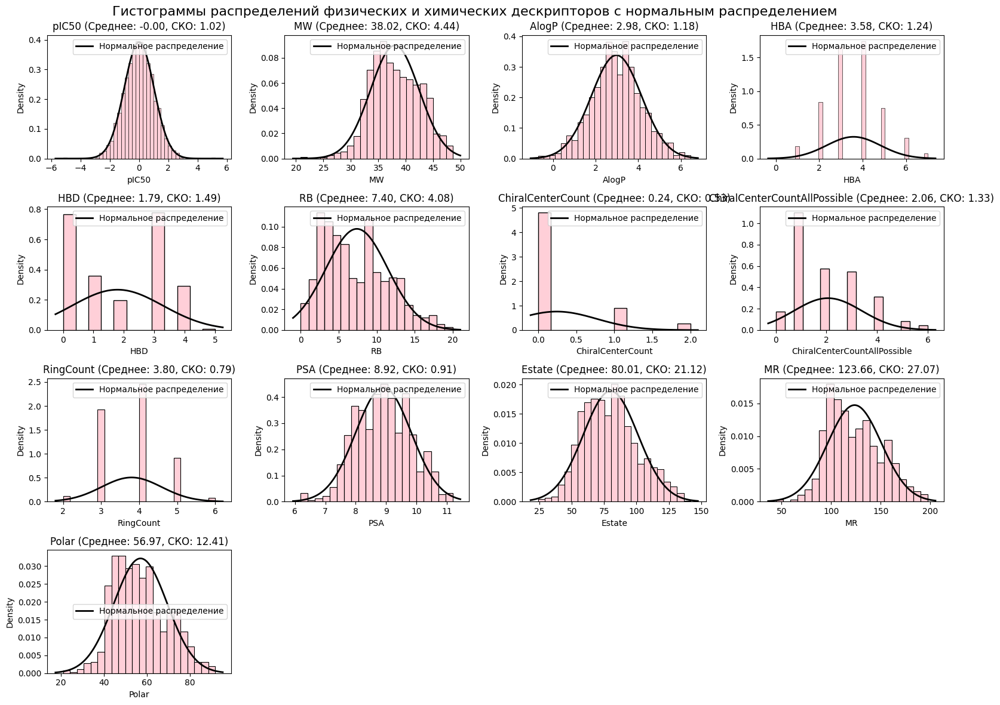

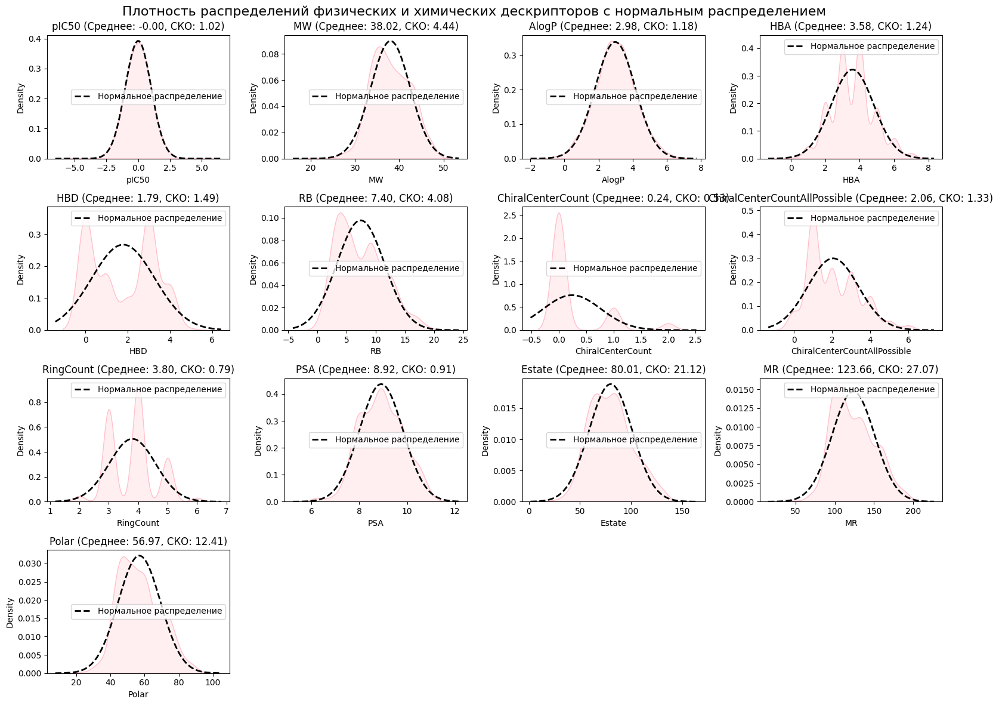

In [28]:
show_graphs(df_transformed1)

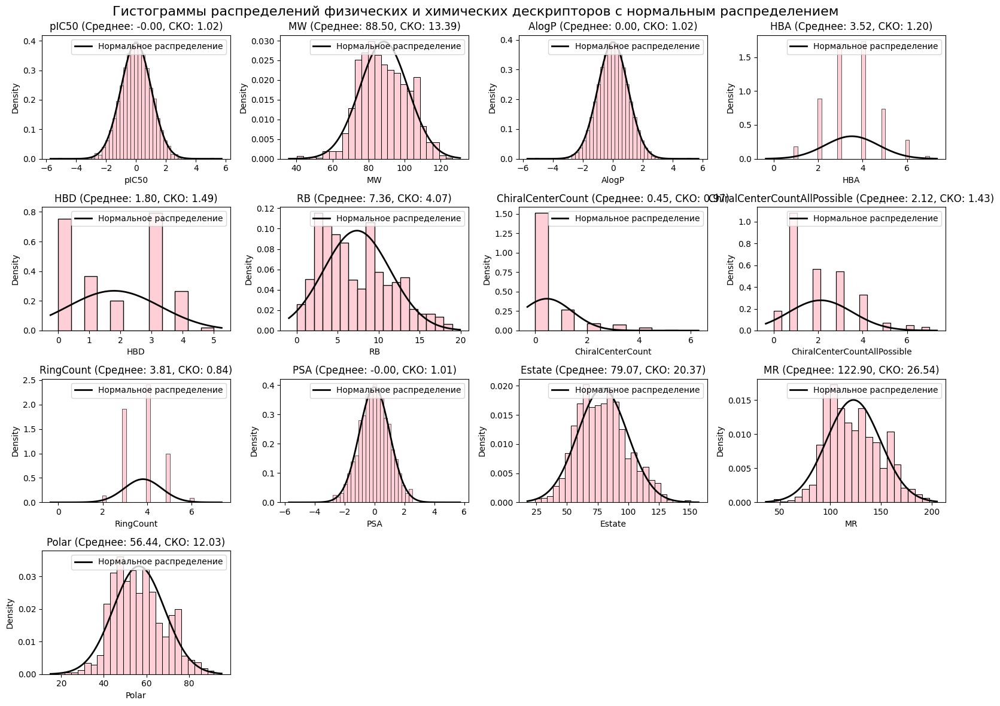

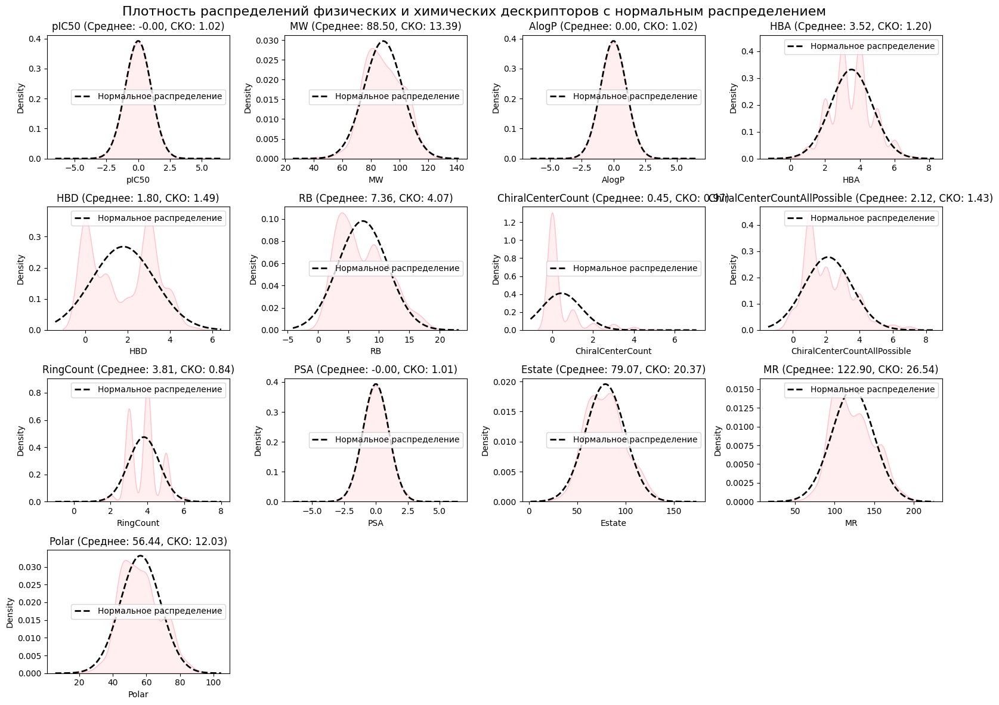

In [29]:
show_graphs(df_transformed2)

Обучим модели с учётом преобразованных переменных

In [30]:
df_transformed1_learn = df_transformed1.copy()
df_transformed2_learn = df_transformed2.copy()
for col in discrete_features:
    df_transformed1_learn[col] = df_transformed1_learn[col].astype('category')
    df_transformed2_learn[col] = df_transformed2_learn[col].astype('category')

In [31]:
X = df_transformed1_learn.drop('pIC50', axis=1)
y = df_transformed1_learn['pIC50']

results['IQR+Z + Transformed'] = model_testing(model, preprocessor, X, y)

r2_score: 0.4401
RMSE: 0.7153


In [32]:
X = df_transformed2_learn.drop('pIC50', axis=1)
y = df_transformed2_learn['pIC50']

results['RealVals + Transformed'] = model_testing(model, preprocessor, X, y)

r2_score: 0.4076
RMSE: 0.7770


## Результаты

In [33]:
for key, val in results.items():
    r2, rmse = val
    print(f"{key}:\nr2 = {r2:.4f}\nRMSE = {rmse:.4f}\n")

Без предобработки:
r2 = -9544814.7457
RMSE = 4124.6234

Минимальная предобработка:
r2 = 0.4560
RMSE = 0.9847

IQR+Z:
r2 = 0.4651
RMSE = 0.9115

RealVals:
r2 = 0.4425
RMSE = 0.9716

IQR+Z + Transformed:
r2 = 0.4401
RMSE = 0.7153

RealVals + Transformed:
r2 = 0.4076
RMSE = 0.7770



## Дополнительная модель

In [34]:
import xgboost as xgb

X = df_clean1_learn.drop("pIC50", axis=1)
y = df_clean1_learn["pIC50"]

xgb_model = xgb.XGBRegressor(
    n_estimators=200,
    max_depth=4,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
    eval_metric="rmse"
)

model_testing(xgb_model, preprocessor, X, y)

X = df_clean2_learn.drop("pIC50", axis=1)
y = df_clean2_learn["pIC50"]

model_testing(xgb_model, preprocessor, X, y)
print()

r2_score: 0.5807
RMSE: 0.8070
r2_score: 0.6184
RMSE: 0.8039



## Рубрика "Эксперименты"

Проводим эксперимент, применяя для непрерывных переменных каждую функцию нормализации и сравниваем результаты

In [35]:
def convert_dtypes(df, features):
    df_transformed = df.copy()
    for col in features:
        df_transformed[col] = df_transformed[col].astype('category')

    return df_transformed

In [36]:
def test_data(df_tmp1, df_tmp2):
    df_tmp1 = convert_dtypes(df_tmp1, discrete_features)
    df_tmp2 = convert_dtypes(df_tmp2, discrete_features)

    print()
    X = df_tmp1.drop('pIC50', axis=1)
    y = df_tmp1['pIC50']
    model_testing(model, preprocessor, X, y)

    X = df_tmp2.drop('pIC50', axis=1)
    y = df_tmp2['pIC50']
    model_testing(model, preprocessor, X, y)
    print()

In [37]:
# Box-Cox
df_tmp1 = transform_params_boxcox(df_clean1, continuous_features)
df_tmp2 = transform_params_boxcox(df_clean2, continuous_features)
test_data(df_tmp1, df_tmp2)

Skewness comparison after Box-Cox transformation:

        Original Skew  Transformed Skew
MW           0.289979         -0.005025
AlogP        0.091496         -0.016607
PSA          0.457390         -0.006961
pIC50       -0.577994         -0.133899
Estate       0.354881         -0.009147
MR           0.374677         -0.003217
Polar        0.373049         -0.003197
Skewness comparison after Box-Cox transformation:

        Original Skew  Transformed Skew
MW           0.185714         -0.006816
AlogP        0.081184          0.017286
PSA          0.076876         -0.031477
pIC50       -0.553746         -0.134019
Estate       0.300876         -0.007581
MR           0.307644         -0.003291
Polar        0.295982         -0.000700

r2_score: 0.4464
RMSE: 6.5832
r2_score: 0.4021
RMSE: 6.2007



In [38]:
# Yeo-Johnson
df_tmp1 = transform_params_yeojohnson(df_clean1, continuous_features)
df_tmp2 = transform_params_yeojohnson(df_clean2, continuous_features)
test_data(df_tmp1, df_tmp2)

Skewness comparison after Yeo-Johnson transformation:

        Original Skew  Transformed Skew
MW           0.289979         -0.005036
AlogP        0.091496          0.004382
PSA          0.457390         -0.006758
pIC50       -0.577994         -0.122308
Estate       0.354881         -0.009023
MR           0.374677         -0.003197
Polar        0.373049         -0.003143
Skewness comparison after Yeo-Johnson transformation:

        Original Skew  Transformed Skew
MW           0.185714         -0.006828
AlogP        0.081184          0.043347
PSA          0.076876         -0.031229
pIC50       -0.553746         -0.122190
Estate       0.300876         -0.007535
MR           0.307644         -0.003334
Polar        0.295982         -0.000905

r2_score: 0.4459
RMSE: 11.8705
r2_score: 0.4012
RMSE: 10.7898



In [39]:
# QuantileTransformer
df_tmp1 = transform_params_quantiletransformer(df_clean1, continuous_features)
df_tmp2 = transform_params_quantiletransformer(df_clean2, continuous_features)
test_data(df_tmp1, df_tmp2)

Skewness comparison after QuantileTransformer transformation:

        Original Skew  Transformed Skew
MW           0.289979         -0.072044
AlogP        0.091496          0.001841
PSA          0.457390         -0.356074
pIC50       -0.577994         -0.001409
Estate       0.354881         -0.077393
MR           0.374677         -0.002306
Polar        0.373049         -0.000475
Skewness comparison after QuantileTransformer transformation:

        Original Skew  Transformed Skew
MW           0.185714         -0.074011
AlogP        0.081184          0.004140
PSA          0.076876         -0.006103
pIC50       -0.553746         -0.001099
Estate       0.300876         -0.068131
MR           0.307644         -0.000916
Polar        0.295982          0.002512

r2_score: 0.4150
RMSE: 0.7311
r2_score: 0.3848
RMSE: 0.7918



В результате, получаем, что лучше всех справился QuantileTransformer. Но, лучше чем он, справился комбинированный метод, использованный в основной работе. Пусть прирост небольшой, но он лучше результата использования только QuantileTransformer, как r2, так и RMSE

# **Первоначальный многомерный анализ**

## Корреляционная матрица и диаграммы рассеяния

Работаем с датой df_clean1

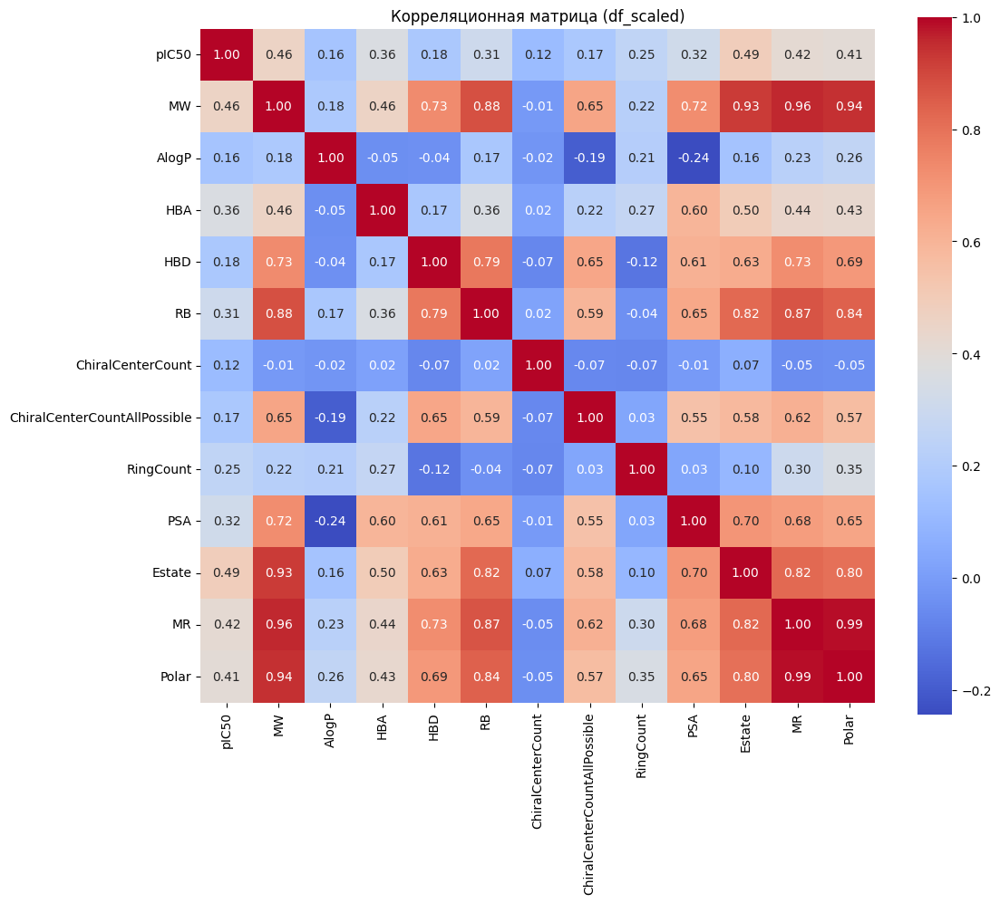

In [40]:
plt.figure(figsize=(12, 10))

corr = df_clean1.corr()

sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True
)

plt.title("Корреляционная матрица (df_scaled)")
plt.show()

In [41]:
corr = df_clean1.corr().abs()

# матрица верхнего треугольника
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

# признаки, корреляция которых > 0.90
to_drop_corr = [col for col in upper.columns if any(upper[col] > 0.90)]

print("Удаляем сильно коррелирующие признаки:", to_drop_corr)

df_clean1 = df_clean1.drop(columns=to_drop_corr)


Удаляем сильно коррелирующие признаки: ['Estate', 'MR', 'Polar']


**Сильно коррелирующие признаки были уделаены в лабораторной работе №3 (>0.9)**

Итог

Корреляционная матрица показывает:
линейных зависимостей между активностью (pIC50) и дескрипторами почти нет,
но между физико-химическими параметрами молекул есть много структурных закономерностей (MW, PSA, RB, HBD, HBA).

Это означает, что:

- простые линейные модели могут работать плохо;

- потребуется многомерный анализ (PCA, t-SNE, UMAP);

- возможны нелинейные зависимости, которые нужно искать scatter-plots.

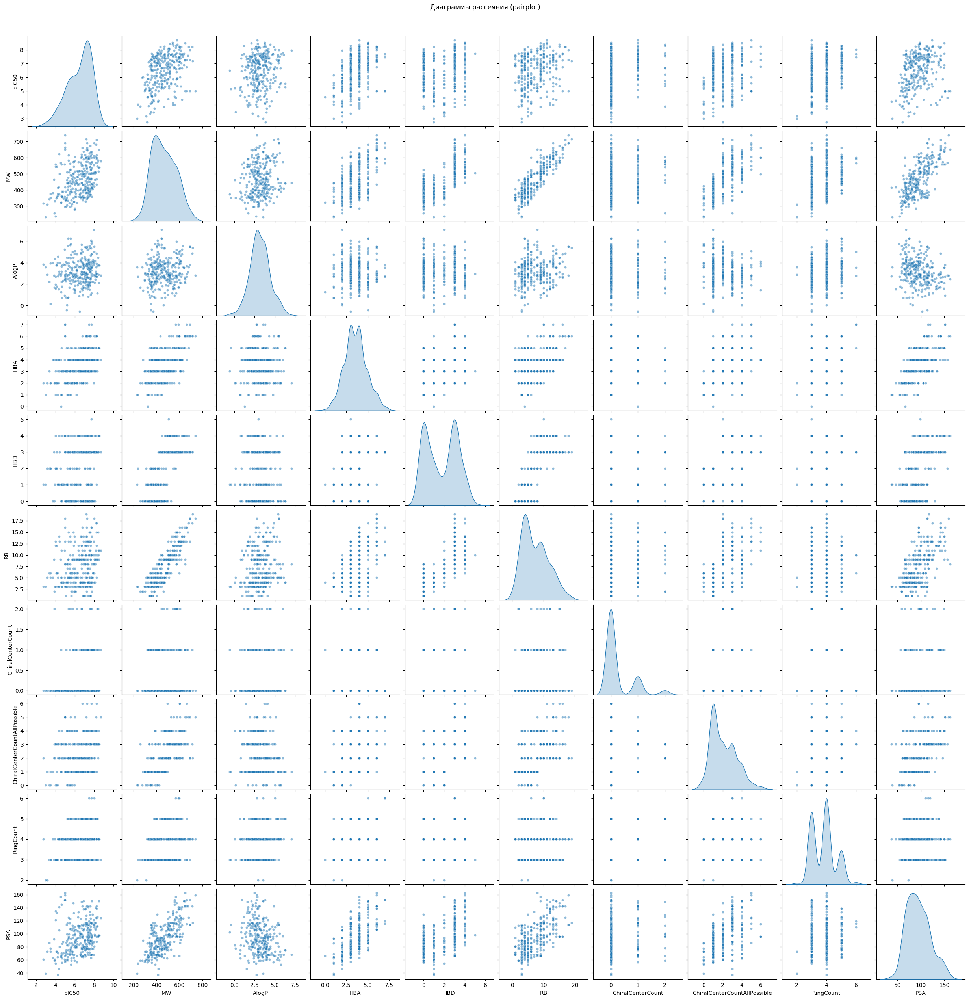

In [42]:
numeric_cols = df_clean1.select_dtypes(include=["float64", "int64"]).columns

df_pair = df_clean1[numeric_cols].sample(300, random_state=42)

sns.pairplot(
    df_pair,
    diag_kind="kde",
    plot_kws={"alpha": 0.5, "s": 20}
)

plt.suptitle("Диаграммы рассеяния (pairplot)", y=1.02)
plt.show()

## Выявление мультиколлинеарности

In [43]:
df_vif = df_clean1.copy()

print(df_vif.isna().sum())

pIC50                           0
MW                              0
AlogP                           0
HBA                             0
HBD                             0
RB                              0
ChiralCenterCount               0
ChiralCenterCountAllPossible    0
RingCount                       0
PSA                             0
dtype: int64


In [44]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [45]:
X_vif = df_vif.drop("pIC50", axis=1)

vif_data = pd.DataFrame()
vif_data["feature"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i)
                   for i in range(X_vif.shape[1])]

vif_data

,feature,VIF
0,MW,189.342467
1,AlogP,11.741434
2,HBA,17.858283
3,HBD,8.760793
4,RB,26.951335
5,ChiralCenterCount,1.245817
6,ChiralCenterCountAllPossible,7.822638
7,RingCount,38.471157
8,PSA,52.351840


**Удаляем те признаки, где значение VIF > 10 (сильная мультиколлинеарность)**

In [46]:
# Признаки для удаления (VIF > 10)
features_to_remove = ['MW', 'PSA', 'RingCount', 'RB', 'HBA', 'AlogP']
print(f"Удаляем {len(features_to_remove)} признаков с VIF > 10")

df_vif_clean = df_vif.drop(columns=features_to_remove, errors='ignore')
print(f"Осталось признаков: {df_vif_clean.shape[1]}")

Удаляем 6 признаков с VIF > 10
Осталось признаков: 4


In [47]:
df_vif_clean

,pIC50,HBD,ChiralCenterCount,ChiralCenterCountAllPossible
1,9.187087,2,0,1
2,9.154901,2,2,2
4,9.000000,3,0,3
5,9.000000,3,0,2
6,9.000000,3,0,2
...,...,...,...,...
1469,3.468904,0,0,1
1470,3.352617,3,0,1
1471,3.158015,2,0,1
1472,3.060481,1,0,0


### Обучение

In [48]:
for col in ['HBD',	'ChiralCenterCount',	'ChiralCenterCountAllPossible']:
  df_vif_clean[col] = df_vif_clean[col].astype("category")

df_vif_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1305 entries, 1 to 1473
Data columns (total 4 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   pIC50                         1305 non-null   float64 
 1   HBD                           1305 non-null   category
 2   ChiralCenterCount             1305 non-null   category
 3   ChiralCenterCountAllPossible  1305 non-null   category
dtypes: category(3), float64(1)
memory usage: 24.9 KB


In [49]:
X = df_vif_clean.drop("pIC50", axis=1)
y = df_vif_clean["pIC50"]

In [50]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.2829
RMSE: 1.0554


(0.282877797445804, 1.0554403560767858)

# **Продвинутые методы многомерного анализа**

## Анализ главных компонентов (PCA)

In [51]:
from sklearn.decomposition import PCA

In [52]:
X_pca = df_clean1.drop("pIC50", axis=1)

pca = PCA()
X_pca_transformed = pca.fit_transform(X_pca)
explained_variance = pca.explained_variance_ratio_

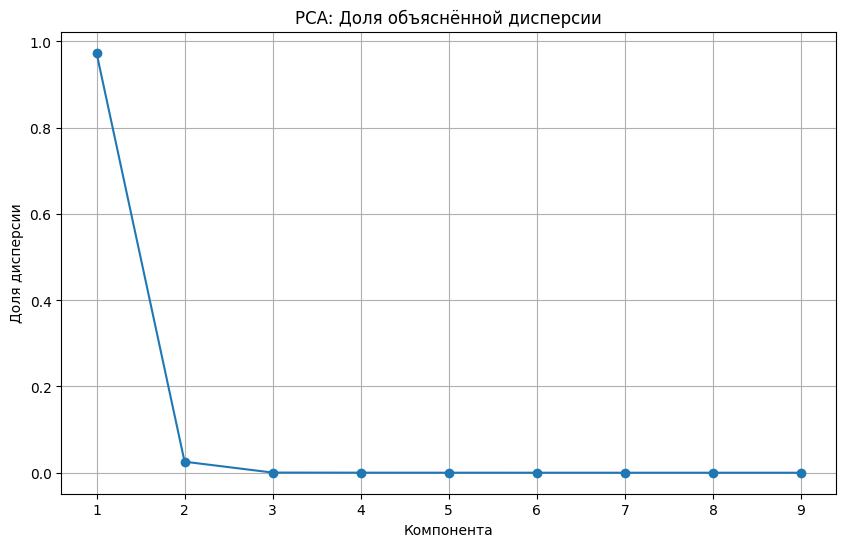

In [53]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1),
         explained_variance, marker='o')
plt.title("PCA: Доля объяснённой дисперсии")
plt.xlabel("Компонента")
plt.ylabel("Доля дисперсии")
plt.grid()
plt.show()

In [54]:
pca_1 = PCA(n_components=1)
pc1 = pca_1.fit_transform(X_pca)

print("Доля объяснённой дисперсии PC1:",
      pca_1.explained_variance_ratio_[0])

Доля объяснённой дисперсии PC1: 0.9736680496346478


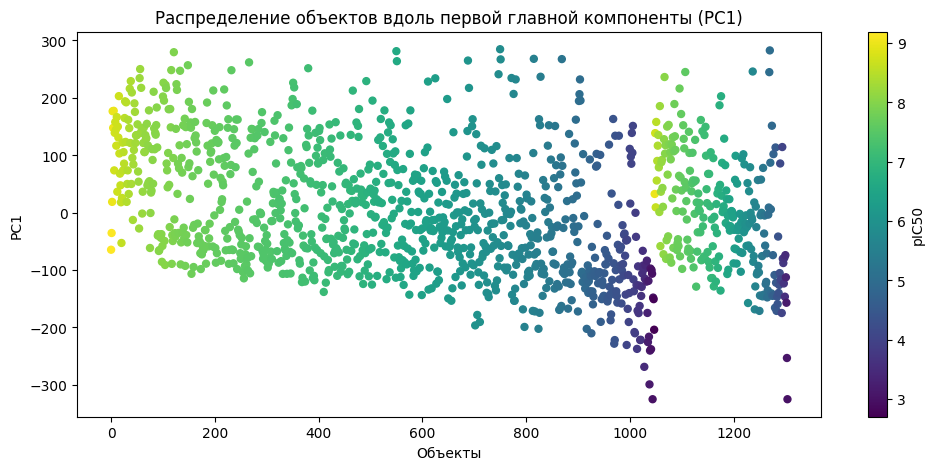

In [55]:
plt.figure(figsize=(12, 5))
plt.scatter(range(len(pc1)), pc1[:, 0],
            c=df_clean1["pIC50"], cmap="viridis", s=25)
plt.title("Распределение объектов вдоль первой главной компоненты (PC1)")
plt.xlabel("Объекты")
plt.ylabel("PC1")
plt.colorbar(label="pIC50")
plt.show()

In [56]:
loadings = pd.Series(
    pca_1.components_[0],
    index=X_pca.columns
).sort_values(ascending=False)

print("Вклады признаков в PC1:")
print(loadings)

Вклады признаков в PC1:
MW                              0.983508
PSA                             0.177117
RB                              0.033655
HBD                             0.010238
ChiralCenterCountAllPossible    0.008195
HBA                             0.005457
AlogP                           0.002035
RingCount                       0.001601
ChiralCenterCount              -0.000058
dtype: float64


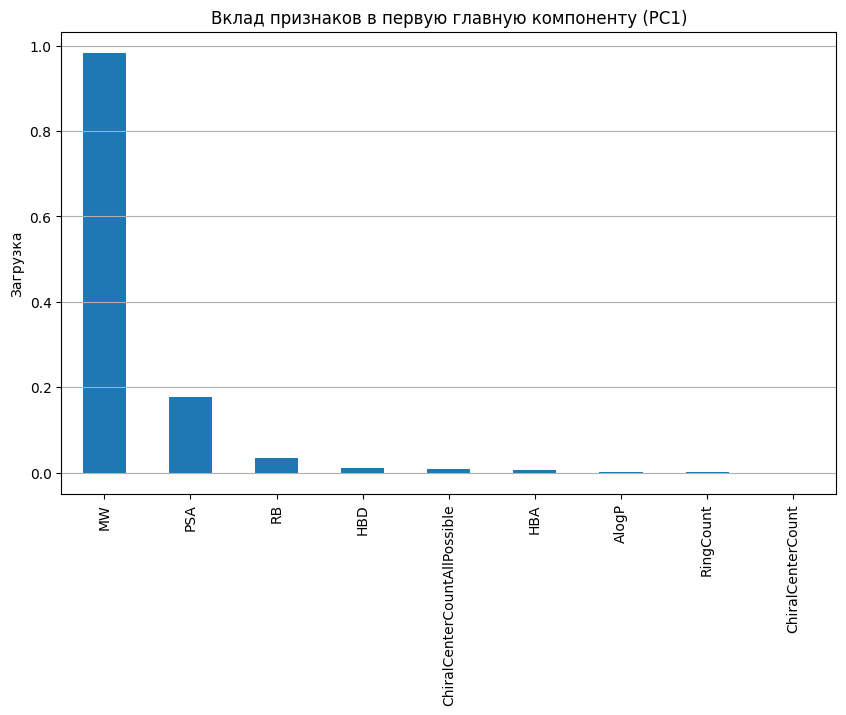

In [57]:
plt.figure(figsize=(10, 6))
loadings.plot(kind='bar')
plt.title("Вклад признаков в первую главную компоненту (PC1)")
plt.ylabel("Загрузка")
plt.grid(axis='y')
plt.show()

### Обучение

In [58]:
y = df_clean1['pIC50']
X = pd.DataFrame(X_pca_transformed[:, :3])

In [59]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.2228
RMSE: 1.0988


(0.22278452276296012, 1.0987726275083862)

## t-SNE

In [60]:
from sklearn.manifold import TSNE

In [61]:
X_tsne = df_clean1.drop("pIC50", axis=1)

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=42
)

In [62]:
tsne_result = tsne.fit_transform(X_tsne)

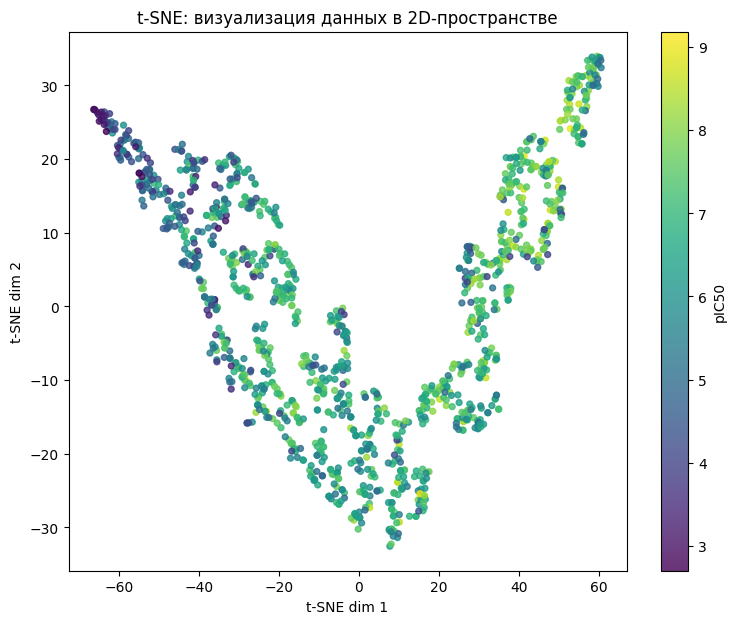

In [63]:
plt.figure(figsize=(9, 7))
plt.scatter(
    tsne_result[:, 0],
    tsne_result[:, 1],
    c=df_clean1["pIC50"],
    cmap="viridis",
    s=18,
    alpha=0.8
)

plt.title("t-SNE: визуализация данных в 2D-пространстве")
plt.xlabel("t-SNE dim 1")
plt.ylabel("t-SNE dim 2")
plt.colorbar(label="pIC50")
plt.show()

### Обучение

In [64]:
y = df_clean1['pIC50']
X = pd.DataFrame(tsne_result)

In [65]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.1794
RMSE: 1.1290


(0.17938566037686055, 1.1290330689029078)

## UMAP

In [66]:
!pip install umap-learn --quiet

In [67]:
import umap

In [126]:
X_umap = df_clean1.drop("pIC50", axis=1)

umap_model = umap.UMAP(
    n_neighbors=5,
    min_dist=0.1,
    n_components=3,
    metric='euclidean',
    random_state=42
)

In [127]:
umap_result = umap_model.fit_transform(X_umap)

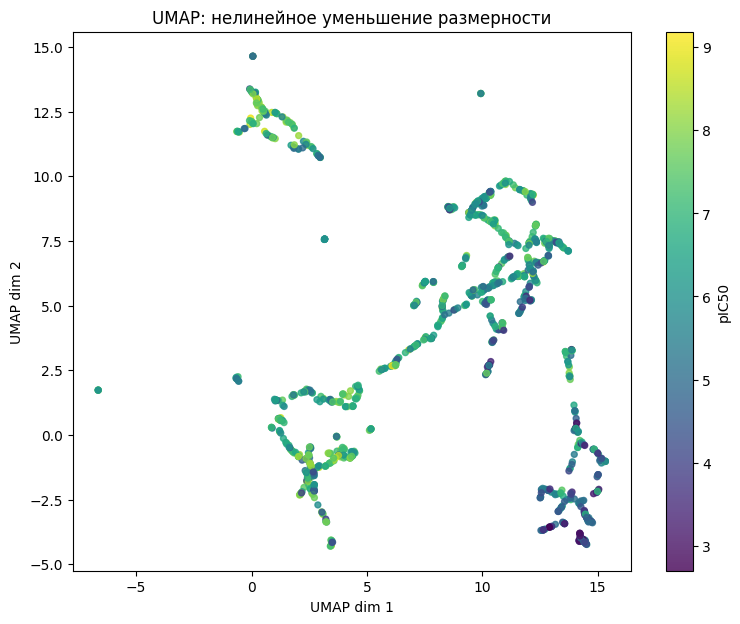

In [128]:
plt.figure(figsize=(9, 7))
plt.scatter(
    umap_result[:, 0], umap_result[:, 1],
    c=df_clean1["pIC50"],
    cmap="viridis",
    s=18,
    alpha=0.8
)

plt.title("UMAP: нелинейное уменьшение размерности")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.colorbar(label="pIC50")
plt.show()

### Обучение

In [129]:
y = df_clean1['pIC50']
X = pd.DataFrame(umap_result)

In [130]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.1473
RMSE: 1.1509


(0.14727797011837762, 1.150908647209035)

## Факторный анализ

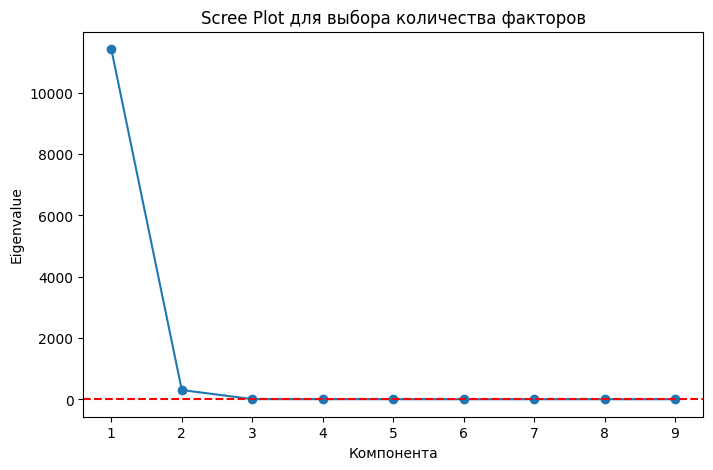

In [73]:
# считаем eigenvalues для factor analysis через PCA (допустимая замена)
pca = PCA()
pca.fit(df_clean1.drop("pIC50", axis=1))

plt.figure(figsize=(8,5))
plt.plot(range(1, 10), pca.explained_variance_, marker="o")
plt.axhline(1, color="red", linestyle="--")  # критерий Кайзера
plt.title("Scree Plot для выбора количества факторов")
plt.xlabel("Компонента")
plt.ylabel("Eigenvalue")
plt.show()

In [74]:
!pip install factor_analyzer

In [75]:
from factor_analyzer import FactorAnalyzer

                               Factor1   Factor2
MW                            0.930556  0.360209
AlogP                        -0.044956  0.271223
HBA                           0.411761  0.389608
HBD                           0.855145 -0.221114
RB                            0.881471  0.051628
ChiralCenterCount            -0.024357 -0.025452
ChiralCenterCountAllPossible  0.710334 -0.069678
RingCount                    -0.007539  0.649144
PSA                           0.779025  0.102073


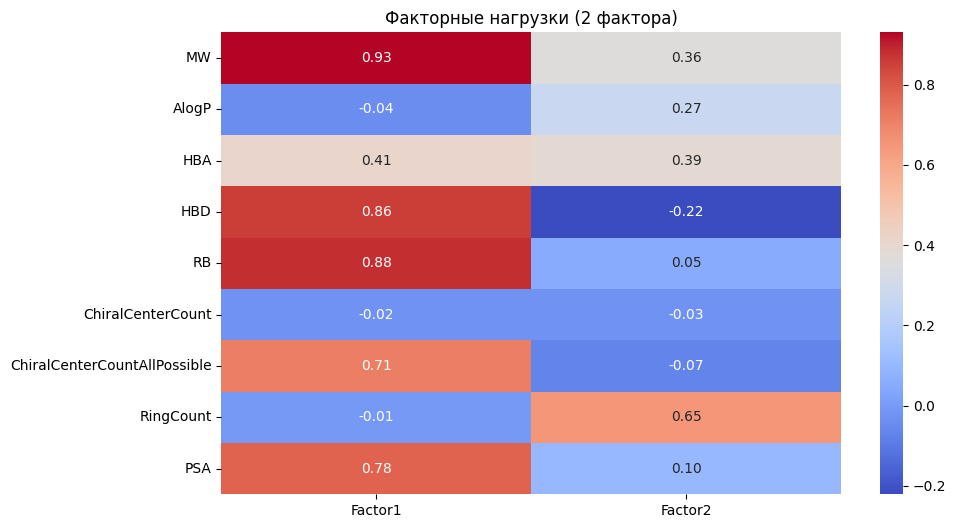

In [76]:
X_fa = df_clean1.drop("pIC50", axis=1)

fa = FactorAnalyzer(n_factors=2, rotation="varimax")
fa.fit(X_fa)

loadings = pd.DataFrame(
    fa.loadings_,
    index=X_fa.columns,
    columns=["Factor1", "Factor2"]
)

print(loadings)

plt.figure(figsize=(10, 6))
sns.heatmap(loadings, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Факторные нагрузки (2 фактора)")
plt.show()

Отбираем те фичи, в которых факторная нагрузка по модулю больше 0.5

In [77]:
columns_to_drop = ['AlogP', 'ChiralCenterCount', 'HBA']
X_fa = X_fa.drop(columns_to_drop, axis=1)

In [78]:
y = df_clean1['pIC50']
X = X_fa

### Обучение

In [79]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.2345
RMSE: 1.0905


(0.23450752787307383, 1.0904545618490564)

## Кластерный анализ (k-means)

In [80]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

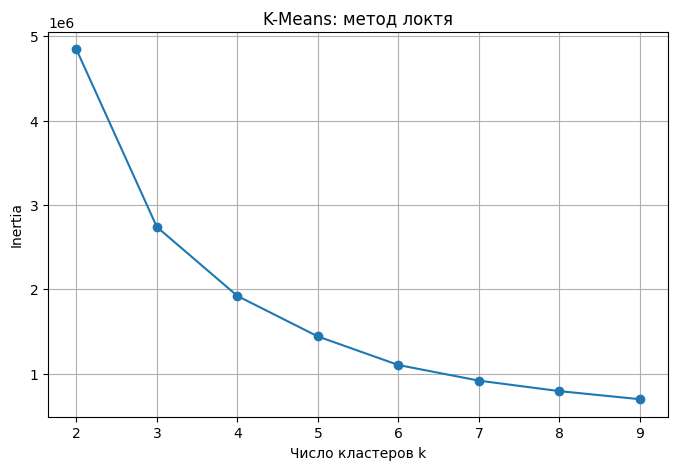

In [81]:
X_cluster = df_clean1.drop("pIC50", axis=1)

inertia = []
K = range(2, 10)

for k in K:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(X_cluster)
    inertia.append(km.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker="o")
plt.title("K-Means: метод локтя")
plt.xlabel("Число кластеров k")
plt.ylabel("Inertia")
plt.grid()
plt.show()

In [82]:
for k in range(2, 10):
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_cluster)
    sil = silhouette_score(X_cluster, labels)
    print(f"k={k}: silhouette={sil:.4f}")

k=2: silhouette=0.5796
k=3: silhouette=0.4961
k=4: silhouette=0.4430
k=5: silhouette=0.4351
k=6: silhouette=0.4283
k=7: silhouette=0.4045
k=8: silhouette=0.3878
k=9: silhouette=0.3734


In [140]:
k_opt = 2
kmeans = KMeans(n_clusters=k_opt, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_cluster)

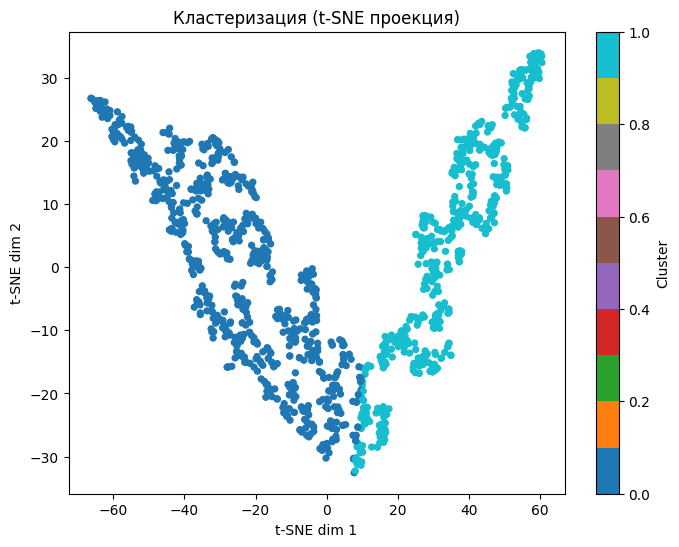

In [141]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_coords = tsne.fit_transform(X_cluster)

plt.figure(figsize=(8, 6))
plt.scatter(tsne_coords[:, 0], tsne_coords[:, 1],
            c=clusters, cmap="tab10", s=18)
plt.title("Кластеризация (t-SNE проекция)")
plt.xlabel("t-SNE dim 1")
plt.ylabel("t-SNE dim 2")
plt.colorbar(label="Cluster")
plt.show()

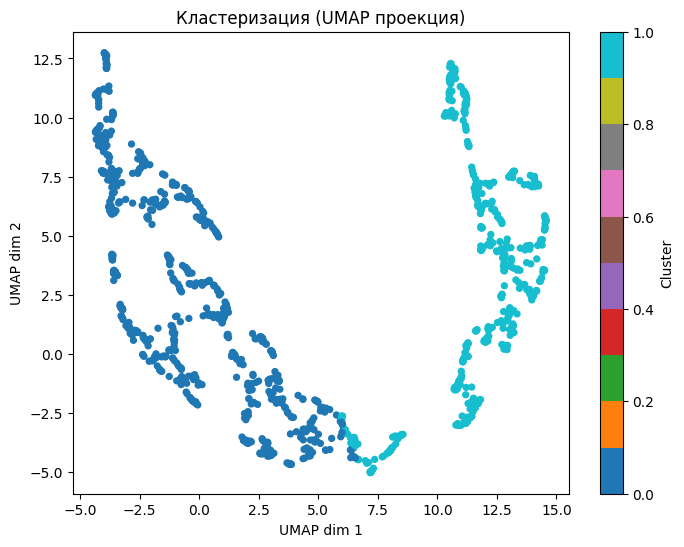

In [142]:
umap_model = umap.UMAP(n_components=2, random_state=42)
umap_coords = umap_model.fit_transform(X_cluster)

plt.figure(figsize=(8, 6))
plt.scatter(umap_coords[:, 0], umap_coords[:, 1],
            c=clusters, cmap="tab10", s=18)
plt.title("Кластеризация (UMAP проекция)")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.colorbar(label="Cluster")
plt.show()

### Обучение

In [143]:
# t-SNE
y = df_clean1['pIC50']
X = pd.DataFrame(tsne_coords)

In [144]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.1794
RMSE: 1.1290


(0.17938566037686055, 1.1290330689029078)

In [145]:
# UMAP
y = df_clean1['pIC50']
X = pd.DataFrame(umap_coords)

In [146]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.1697
RMSE: 1.1357


(0.169664009620197, 1.1357010906527423)

# **Дополнительные методы создания признаков**

## Генерация взаимодействий признаков

In [90]:
from sklearn.preprocessing import PolynomialFeatures

In [91]:
features = ["MW", "AlogP", "HBA", "HBD", "RB",
            "ChiralCenterCount", "ChiralCenterCountAllPossible",
            "RingCount", "PSA"]

X = df_clean1[features]

poly_inter = PolynomialFeatures(degree=2, include_bias=False, interaction_only=True)
X_inter = poly_inter.fit_transform(X)

inter_names = poly_inter.get_feature_names_out(features)

df_interactions = pd.DataFrame(X_inter, columns=inter_names, index=df_clean1.index)

interaction_cols = [col for col in df_interactions.columns if " " in col]

df_inter_final = pd.concat([df_clean1, df_interactions[interaction_cols]], axis=1)
print(f"Получено взаимодействий признаков: {len(interaction_cols)}")

df_inter_final.head()

Получено взаимодействий признаков: 36


,pIC50,MW,AlogP,HBA,HBD,RB,ChiralCenterCount,ChiralCenterCountAllPossible,RingCount,PSA,...,RB ChiralCenterCount,RB ChiralCenterCountAllPossible,RB RingCount,RB PSA,ChiralCenterCount ChiralCenterCountAllPossible,ChiralCenterCount RingCount,ChiralCenterCount PSA,ChiralCenterCountAllPossible RingCount,ChiralCenterCountAllPossible PSA,RingCount PSA
1,9.187087,403.55969,5.7644,2,2,7,0,1,3,68.010002,...,0.0,7.0,21.0,476.070014,0.0,0.0,0.000000,3.0,68.010002,204.030006
2,9.154901,431.56979,4.4014,3,2,5,2,2,4,77.239998,...,10.0,10.0,20.0,386.199990,4.0,8.0,154.479996,8.0,154.479996,308.959992
4,9.000000,484.62601,2.9008,4,3,9,0,3,4,88.059998,...,0.0,27.0,36.0,792.539982,0.0,0.0,0.000000,12.0,264.179994,352.239992
5,9.000000,639.75238,3.8163,6,3,17,0,2,3,117.070000,...,0.0,34.0,51.0,1990.190000,0.0,0.0,0.000000,6.0,234.140000,351.210000
6,9.000000,612.77820,5.9233,5,3,7,0,2,6,104.710000,...,0.0,14.0,42.0,732.970000,0.0,0.0,0.000000,12.0,209.420000,628.260000


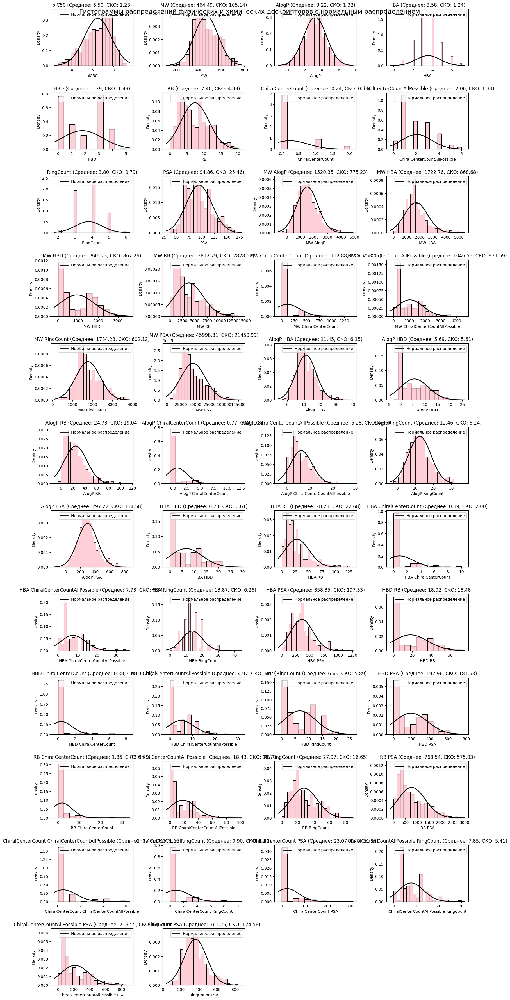

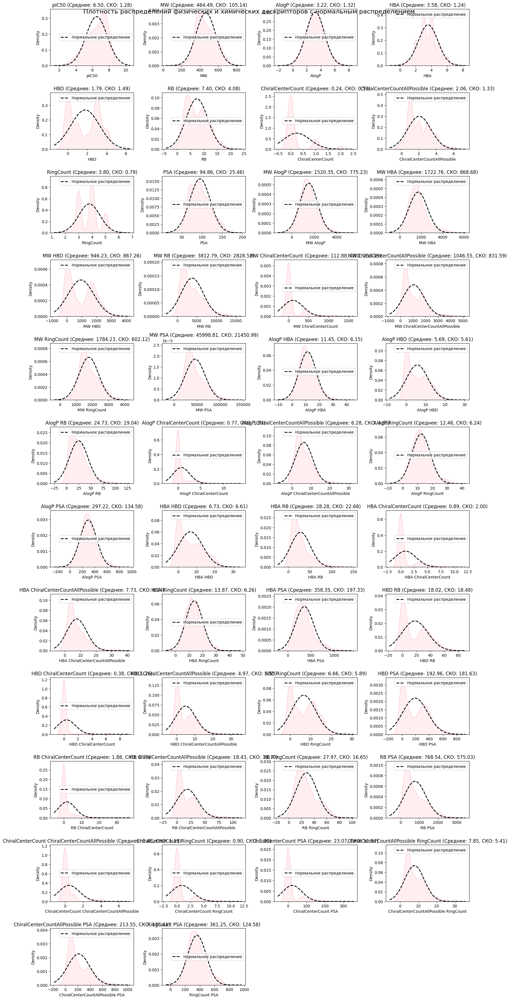

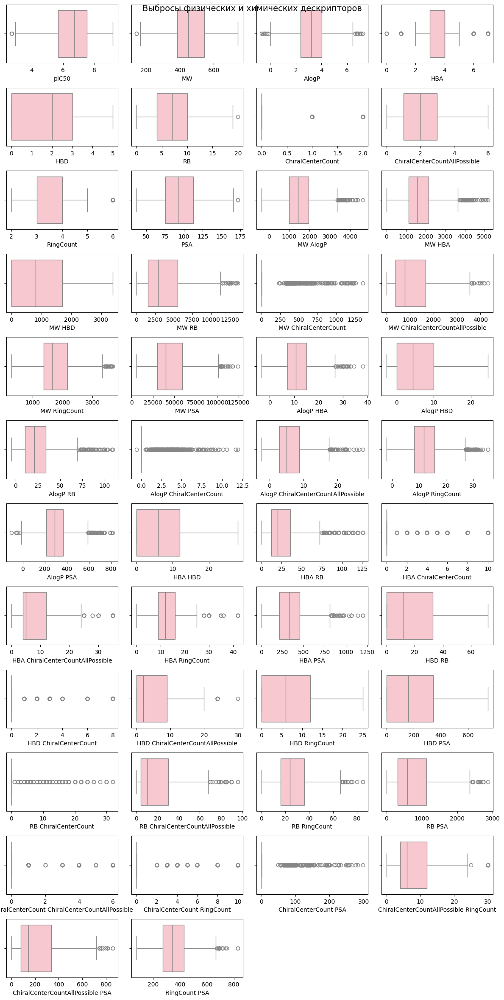

In [92]:
show_graphs(df_inter_final, boxes=True)

### Обучение

In [93]:
y = df_clean1['pIC50']
X = df_inter_final.drop('pIC50', axis=1)

In [94]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.4985
RMSE: 0.8826


(0.49852117844618793, 0.882598957004728)

## Полиномиальные признаки

In [95]:
features = ["MW", "AlogP", "HBA", "HBD", "RB",
            "ChiralCenterCount", "ChiralCenterCountAllPossible",
            "RingCount", "PSA"]

X_base = df_clean1[features]

In [96]:
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X_base)

poly_names = poly.get_feature_names_out(features)

df_poly = pd.DataFrame(X_poly, columns=poly_names, index=df_clean1.index)

In [97]:
poly_only = [col for col in poly_names if col not in features]

df_poly_final = pd.concat([df_clean1, df_poly[poly_only]], axis=1)

print("Создано полиномиальных признаков:", len(poly_only))
df_poly_final.head()

Создано полиномиальных признаков: 45


,pIC50,MW,AlogP,HBA,HBD,RB,ChiralCenterCount,ChiralCenterCountAllPossible,RingCount,PSA,...,ChiralCenterCount^2,ChiralCenterCount ChiralCenterCountAllPossible,ChiralCenterCount RingCount,ChiralCenterCount PSA,ChiralCenterCountAllPossible^2,ChiralCenterCountAllPossible RingCount,ChiralCenterCountAllPossible PSA,RingCount^2,RingCount PSA,PSA^2
1,9.187087,403.55969,5.7644,2,2,7,0,1,3,68.010002,...,0.0,0.0,0.0,0.000000,1.0,3.0,68.010002,9.0,204.030006,4625.360372
2,9.154901,431.56979,4.4014,3,2,5,2,2,4,77.239998,...,4.0,4.0,8.0,154.479996,4.0,8.0,154.479996,16.0,308.959992,5966.017291
4,9.000000,484.62601,2.9008,4,3,9,0,3,4,88.059998,...,0.0,0.0,0.0,0.000000,9.0,12.0,264.179994,16.0,352.239992,7754.563248
5,9.000000,639.75238,3.8163,6,3,17,0,2,3,117.070000,...,0.0,0.0,0.0,0.000000,4.0,6.0,234.140000,9.0,351.210000,13705.384900
6,9.000000,612.77820,5.9233,5,3,7,0,2,6,104.710000,...,0.0,0.0,0.0,0.000000,4.0,12.0,209.420000,36.0,628.260000,10964.184100


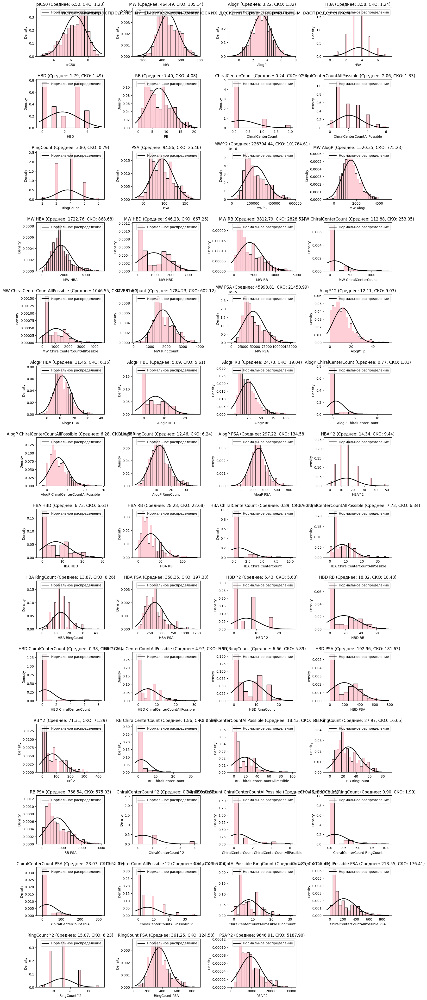

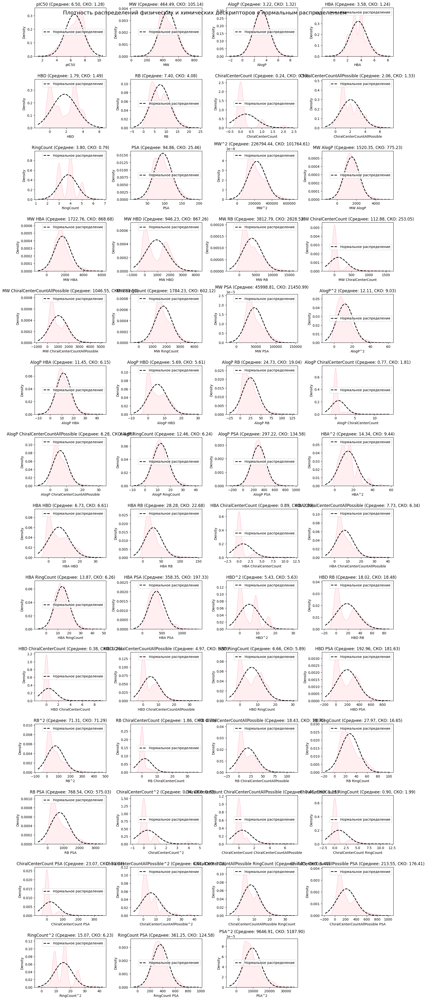

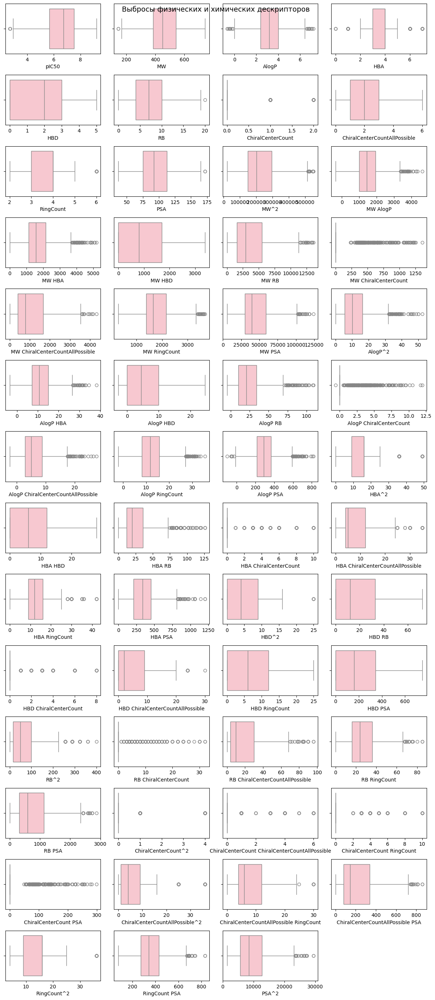

In [98]:
show_graphs(df_poly_final, boxes=True)

### Обучение

In [99]:
y = df_clean1['pIC50']
X = df_poly_final.drop('pIC50', axis=1)

In [100]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.5091
RMSE: 0.8733


(0.5090530331846017, 0.8732817859737791)

## Биннинг и дискретизация

In [101]:
continuous_features = ["MW", "AlogP", "PSA"]

df_binned = df_clean1.copy()

n_bins = 4

for col in continuous_features:
    df_binned[col + "_bin"] = pd.qcut(
        df_binned[col],
        q=n_bins,
        labels=[f"{col}_low", f"{col}_midlow", f"{col}_midhigh", f"{col}_high"]
    )

print("Созданы категориальные признаки после биннинга:")
for col in continuous_features:
    print(" -", col + "_bin")

df_binned.head()

Созданы категориальные признаки после биннинга:
 - MW_bin
 - AlogP_bin
 - PSA_bin


,pIC50,MW,AlogP,HBA,HBD,RB,ChiralCenterCount,ChiralCenterCountAllPossible,RingCount,PSA,MW_bin,AlogP_bin,PSA_bin
1,9.187087,403.55969,5.7644,2,2,7,0,1,3,68.010002,MW_midlow,AlogP_high,PSA_low
2,9.154901,431.56979,4.4014,3,2,5,2,2,4,77.239998,MW_midlow,AlogP_high,PSA_midlow
4,9.000000,484.62601,2.9008,4,3,9,0,3,4,88.059998,MW_midhigh,AlogP_midlow,PSA_midlow
5,9.000000,639.75238,3.8163,6,3,17,0,2,3,117.070000,MW_high,AlogP_midhigh,PSA_high
6,9.000000,612.77820,5.9233,5,3,7,0,2,6,104.710000,MW_high,AlogP_high,PSA_midhigh


In [102]:
df_base = df_clean1.copy()

interaction_cols = [col for col in df_interactions.columns if " " in col]
df_inter = df_interactions[interaction_cols]

df_poly_only = df_poly[poly_only]

bin_features = [col + "_bin" for col in continuous_features]
df_bins = df_binned[bin_features]

df_bins_ohe = pd.get_dummies(df_bins, drop_first=False)

In [103]:
df_final = pd.concat(
    [
        df_base,          # масштабированные базовые признаки
        df_inter,         # взаимодействия
        df_poly_only,     # полиномиальные признаки
        df_bins_ohe       # оцифрованные категориальные биннинги
    ],
    axis=1
)

print("Размер финального датасета:", df_final.shape)

df_final.head()

Размер финального датасета: (1305, 103)


,pIC50,MW,AlogP,HBA,HBD,RB,ChiralCenterCount,ChiralCenterCountAllPossible,RingCount,PSA,...,MW_bin_MW_midhigh,MW_bin_MW_high,AlogP_bin_AlogP_low,AlogP_bin_AlogP_midlow,AlogP_bin_AlogP_midhigh,AlogP_bin_AlogP_high,PSA_bin_PSA_low,PSA_bin_PSA_midlow,PSA_bin_PSA_midhigh,PSA_bin_PSA_high
1,9.187087,403.55969,5.7644,2,2,7,0,1,3,68.010002,...,False,False,False,False,False,True,True,False,False,False
2,9.154901,431.56979,4.4014,3,2,5,2,2,4,77.239998,...,False,False,False,False,False,True,False,True,False,False
4,9.000000,484.62601,2.9008,4,3,9,0,3,4,88.059998,...,True,False,False,True,False,False,False,True,False,False
5,9.000000,639.75238,3.8163,6,3,17,0,2,3,117.070000,...,False,True,False,False,True,False,False,False,False,True
6,9.000000,612.77820,5.9233,5,3,7,0,2,6,104.710000,...,False,True,False,False,False,True,False,False,True,False


In [104]:
data = df_final.copy()

##Методы отбора признаков

Модель LASSO с подбором альфа

In [105]:
from sklearn.linear_model import LassoCV

In [106]:
X = data.drop('pIC50', axis=1)
y = data['pIC50']

In [107]:
# Модель LASSO с подбором альфа
lasso = LassoCV(cv=5, random_state=42, n_jobs=-1)
lasso.fit(X, y)

# Коэффициенты
coef = pd.Series(lasso.coef_, index=X.columns)

print("Лучшее значение alpha:", lasso.alpha_)
print("\nКоличество выбранных признаков:", np.sum(coef != 0))

selected_features = coef[coef != 0].index.tolist()
print("\nВыбранные признаки:")
print(selected_features)

# Таблица коэффициентов
coef_table = pd.DataFrame({
    "feature": X.columns,
    "coef": lasso.coef_
}).sort_values(by="coef", key=np.abs, ascending=False)

coef_table.head(20)

Лучшее значение alpha: 55.1422728906926

Количество выбранных признаков: 8

Выбранные признаки:
['MW HBD', 'MW RB', 'MW ChiralCenterCountAllPossible', 'MW^2', 'MW HBA', 'MW RB', 'MW ChiralCenterCountAllPossible', 'PSA^2']


,feature,coef
49,MW RB,-0.000124
47,MW HBA,0.000122
12,MW RB,-0.000081
51,MW ChiralCenterCountAllPossible,-0.000074
14,MW ChiralCenterCountAllPossible,-0.000045
11,MW HBD,-0.000031
89,PSA^2,-0.000018
45,MW^2,0.000012
3,HBD,-0.000000
4,RB,0.000000


### Обучение для каждой даты отдельно отобрать признаки

In [108]:
data_unique_names = data.loc[:, ~data.columns.duplicated(keep='first')]

In [109]:
selected_features = list(dict.fromkeys(selected_features))

In [110]:
y = df_clean1['pIC50']
X = data_unique_names[selected_features]

In [111]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.2269
RMSE: 1.0959


(0.22687079354741202, 1.0958803796957397)

# Байесовские сети

## Обучение структуры

In [112]:
!pip install pgmpy

In [113]:
df_subset = data_unique_names[selected_features + ['pIC50']]

In [114]:
#дискретизация методом равных интервалов
df_disc = df_subset.copy()

for col in df_disc.columns:
    df_disc[col] = pd.qcut(df_disc[col], q=2,
                          labels=[0, 1],
                          duplicates='drop')

Обучение структуры Bayesian Network с Hill-Climbing

In [115]:
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.estimators import HillClimbSearch

hc = HillClimbSearch(df_disc)
best_model = hc.estimate(max_iter=1000,
                         scoring_method='bic-d',
                         show_progress=True)

model = DiscreteBayesianNetwork(best_model.edges())

print(f"Найдено {len(model.edges())} рёбер:")
for edge in model.edges():
    print(f"  {edge[0]} → {edge[1]}")

  0%|          | 0/1000 [00:00<?, ?it/s]

Найдено 12 рёбер:
  MW HBD → MW ChiralCenterCountAllPossible
  MW HBD → PSA^2
  PSA^2 → MW HBA
  MW RB → MW HBD
  MW^2 → MW RB
  MW^2 → MW ChiralCenterCountAllPossible
  MW^2 → MW HBD
  MW^2 → MW HBA
  MW^2 → PSA^2
  MW^2 → pIC50
  MW HBA → pIC50
  pIC50 → MW ChiralCenterCountAllPossible


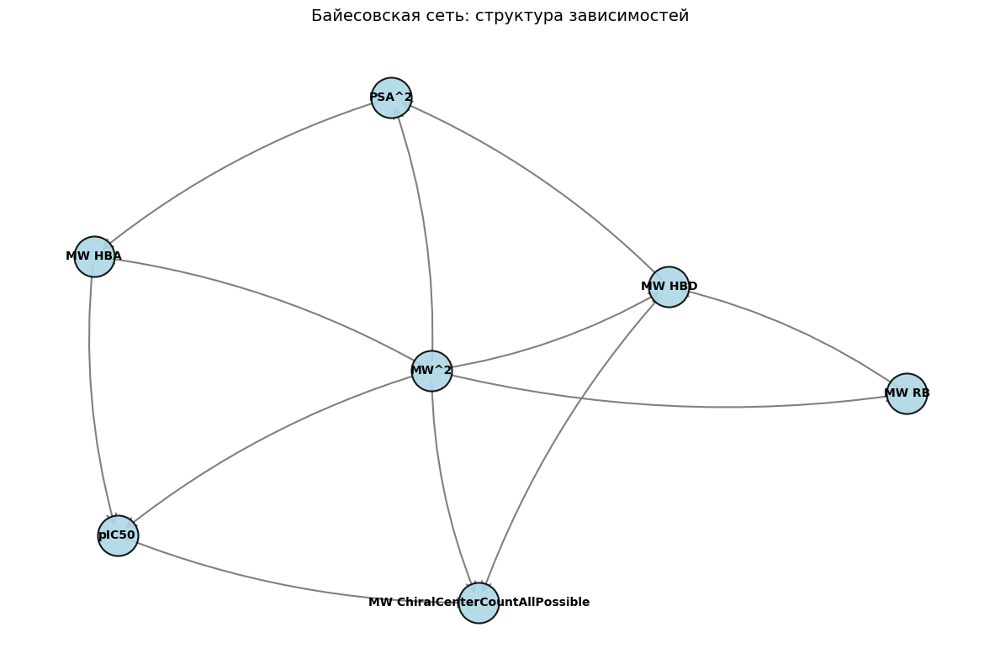

 СТАТИСТИКА СЕТИ:
• Число узлов: 7
• Число ребер: 12
• Плотность графа: 0.286
• Является ли DAG: True

 ТОП-5 узлов по степени влияния:

Самые зависимые (больше всего родителей):
  MW ChiralCenterCountAllPossible: 3 входящих связей
  MW HBD: 2 входящих связей
  PSA^2: 2 входящих связей
  MW HBA: 2 входящих связей
  pIC50: 2 входящих связей

Самые влиятельные (больше всего детей):
  MW^2: 6 исходящих связей
  MW HBD: 2 исходящих связей
  PSA^2: 1 исходящих связей
  MW HBA: 1 исходящих связей
  MW RB: 1 исходящих связей


In [116]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.DiGraph()
G.add_edges_from(model.edges())

plt.figure(figsize=(12, 8))

pos = nx.kamada_kawai_layout(G)

node_size = 1200
nx.draw_networkx_nodes(G, pos,
                      node_color='lightblue',
                      node_size=node_size,
                      edgecolors='black',
                      linewidths=1.5,
                      alpha=0.9)

nx.draw_networkx_edges(G, pos,
                      arrowstyle='->',
                      arrowsize=20,
                      edge_color='gray',
                      width=1.5,
                      connectionstyle="arc3,rad=0.1")

nx.draw_networkx_labels(G, pos,
                       font_size=10,
                       font_weight='bold',
                       font_family='sans-serif')

plt.title('Байесовская сеть: структура зависимостей', fontsize=14, pad=20)
plt.axis('off')

plt.tight_layout()
plt.show()

print(" СТАТИСТИКА СЕТИ:")
print(f"• Число узлов: {G.number_of_nodes()}")
print(f"• Число ребер: {G.number_of_edges()}")
print(f"• Плотность графа: {nx.density(G):.3f}")
print(f"• Является ли DAG: {nx.is_directed_acyclic_graph(G)}")


print("\n ТОП-5 узлов по степени влияния:")
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())

print("\nСамые зависимые (больше всего родителей):")
for node, degree in sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"  {node}: {degree} входящих связей")

print("\nСамые влиятельные (больше всего детей):")
for node, degree in sorted(out_degrees.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"  {node}: {degree} исходящих связей")

## Условная независимость

*Без условий*

In [117]:
from pgmpy.models import DiscreteBayesianNetwork

# Создаём сеть из DAG Hill-Climb
bn_model = DiscreteBayesianNetwork(best_model.edges())

# Обучаем на дискретизированных данных
bn_model.fit(df_disc)

# Список рёбер
edges = list(bn_model.edges())
results = []

for (var1, var2) in edges:
    # True = зависимы, False = независимы
    independent = not bn_model.is_dconnected(var1, var2)
    results.append((var1, var2, independent))

print("Пары признаков, условно независимые без условий:")
for r in results:
    if r[2]:
        print(f"{r[0]} и {r[1]} условно независимы")


Пары признаков, условно независимые без условий:


*Условная независимость с учётом родителей узла и целевой переменной*

In [118]:
bn_model = DiscreteBayesianNetwork(best_model.edges())
bn_model.fit(df_disc)

edges = list(bn_model.edges())
results = []

for (var1, var2) in edges:
    parents_var1 = list(bn_model.get_parents(var1))

    independent = not bn_model.is_dconnected(var1, var2, observed=parents_var1 + ['pIC50'])
    results.append((var1, var2, independent))

print("\nПары признаков, условно независимые с учётом родителей и 'pIC50':")
for r in results:
    if r[2]:
        print(f"{r[0]} и {r[1]} условно независимы")


Пары признаков, условно независимые с учётом родителей и 'pIC50':
MW^2 и pIC50 условно независимы
MW HBA и pIC50 условно независимы
pIC50 и MW ChiralCenterCountAllPossible условно независимы


## Применение

## Отбор переменных

In [119]:
# ОТБОР ПРИЗНАКОВ, ЗАВИСИМЫХ ОТ pIC50
important_features = []

for (var1, var2) in bn_model.edges():
    if 'pIC50' in (var1, var2):
        # Определяем, какой узел - признак, а какой - pIC50
        feature = var1 if var2 == 'pIC50' else var2
        target = 'pIC50'

        # Получаем родителей признака (кроме pIC50)
        parents = [p for p in bn_model.get_parents(feature) if p != target]

        # Проверяем, остаётся ли зависимость при условии родителей
        # active_trail_nodes вернёт True, если есть активный путь (зависимость)
        reachable = bn_model.active_trail_nodes(variables=feature, observed=parents).get(feature, set())
        has_dependency = target in reachable

        if has_dependency:
            important_features.append(feature)

important_features = list(set(important_features))
print("\n" + "="*50)
print("ПРИЗНАКИ, КОТОРЫЕ НАПРЯМУЮ ВЛИЯЮТ НА pIC50:")
print("="*50)
print(f"Найдено {len(important_features)} признаков:")
for feat in important_features:
    print(f"  • {feat}")


ПРИЗНАКИ, КОТОРЫЕ НАПРЯМУЮ ВЛИЯЮТ НА pIC50:
Найдено 3 признаков:
  • MW ChiralCenterCountAllPossible
  • MW HBA
  • MW^2


### Генерация синтетических данных

In [120]:
synthetic_data = bn_model.simulate(n_samples=100, seed=42)
synthetic_data.head()

  0%|          | 0/7 [00:00<?, ?it/s]

,MW RB,MW HBD,MW ChiralCenterCountAllPossible,PSA^2,MW^2,pIC50,MW HBA
0,0,0,0,0,0,0,0
1,0,0,0,0,1,1,1
2,1,1,1,0,1,0,0
3,1,1,1,1,1,1,0
4,0,0,0,0,0,0,0


### Балансировка классов

In [121]:
print(df_disc['pIC50'].value_counts())

# Выбираем синтетические наблюдения для редкого класса
rare_class = df_disc['pIC50'].value_counts().idxmin()
synthetic_balanced = synthetic_data[synthetic_data['pIC50'] == rare_class]

# Объединяем с исходными данными
df_balanced = pd.concat([df_disc, synthetic_balanced], axis=0)
df_balanced['pIC50'].value_counts()

pIC50
0    653
1    652
Name: count, dtype: int64


,count
pIC50,
1,704
0,653


# Повторное построение модели

## Подготовка обновленного набора данных

In [122]:
important_features = ['MW HBA', 'MW^2']

X_original = df_subset[important_features]  # Непрерывные признаки
y_original = df_subset['pIC50']              # Непрерывная целевая


X_synth = synthetic_data[important_features]
y_synth = synthetic_data['pIC50']

X_final = pd.concat([X_original, X_synth], axis=0, ignore_index=True)
y_final = pd.concat([y_original, y_synth], axis=0, ignore_index=True)

print(f"Итоговый размер: {X_final.shape[0]} образцов")
print(f"Исходные: {len(X_original)}, Синтетические: {len(X_synth)}")

Итоговый размер: 1405 образцов
Исходные: 1305, Синтетические: 100


## Обучение

In [123]:
y = y_final
X = X_final

In [124]:
model_testing(LinearRegression(n_jobs=-1), preprocessor, X, y)

r2_score: 0.4414
RMSE: 1.4790


(0.44139181529877947, 1.4789648116289404)

XGB

In [125]:
model_testing(xgb_model, preprocessor, X, y)

r2_score: 0.7449
RMSE: 0.9994


(0.7449034665210484, 0.9994394139367576)